In [79]:
from glob import glob
import pandas as pd

# df = pd.read_csv('./df_files/df.csv')
# nohat_df = pd.read_csv('./df_files/nohat_df.csv')

In [90]:
pred_labels = glob('../../../datasets/aihub_safety/human_car_ver2/cls7_pred/exp3/labels/*')

In [91]:
import os

In [92]:
labels = glob('../../../datasets/aihub_safety/human_car_ver2/cls7_labels/*')
lab_dir = ('../../../datasets/aihub_safety/human_car_ver2/cls7_labels/')

In [93]:
def xywh2xyxy(xywh):
    if isinstance(xywh[0],str):
        xywh = [float(i) for i in xywh]
    return [(xywh[0] - xywh[2]/2) ,(xywh[1] - xywh[3]/2) ,(xywh[0] + xywh[2]/2) ,(xywh[1] + xywh[3]/2)]

def iou(xyxy1,xyxy2):

    min_x1,min_y1,max_x1,max_y1 = xyxy1
    min_x2,min_y2,max_x2,max_y2 = xyxy2

    intersection_x_length = min(max_x1, max_x2) - max(min_x1, min_x2)
    intersection_y_length = min(max_y1, max_y2) - max(min_y1, min_y2)

    if (intersection_x_length < 0) or (intersection_y_length < 0):
        return 0
    inter_area = intersection_x_length * intersection_y_length

    area_1 = (max_x1 - min_x1) * (max_y1 - min_y1)
    area_2 = (max_x2 - min_x2) * (max_y2 - min_y2)

    if (inter_area /(area_1 + area_2 - inter_area)) > 1 :
        print(xyxy1,xyxy2)
        print(intersection_x_length,intersection_y_length)
        print(inter_area)
        print(area_1,area_2)

    return inter_area /(area_1 + area_2 - inter_area)

In [94]:
from tqdm import tqdm

In [95]:

# [filename , lab_cls, pred_cls, lab_xyxy, pred_xyxy, iou ]

list01 = []

for i in tqdm(pred_labels):
    with open(lab_dir + os.path.basename(i), 'r') as f:
        lab_datas = f.readlines()
    
    with open(i, 'r') as f:
        pred_datas = f.readlines()
    


    for pred_data in pred_datas:
        pred_cls = pred_data.split(' ')[0]
        if pred_cls in ['6']:
            for lab_data in lab_datas:
                lab_cls = lab_data.split(' ')[0]
                if lab_cls in ['7']:
                    pred_xyxy = xywh2xyxy(pred_data.split(' ')[1:])
                    lab_xyxy = xywh2xyxy(lab_data.split(' ')[1:])
                    
                    iou_value = iou(pred_xyxy,lab_xyxy)
                    if iou_value >= 0.33:
                        list01.append([os.path.basename(i),lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou_value])


100%|██████████| 87015/87015 [00:07<00:00, 11823.82it/s]


In [96]:
list01[0]

['S2-N2101M28294.txt',
 '7',
 '6',
 [0.7661458333333334,
  0.3731481481481481,
  0.7989583333333333,
  0.4444444444444444],
 [0.76562485, 0.37592545, 0.79583315, 0.43703654999999997],
 0.765092851393747]

In [97]:
a = set()
for i in list01:
    # print(i)
    a.add(i[0])
    

In [98]:
len(pred_labels)

87015

In [99]:
len(list01)

9264

In [54]:
a

{'S2-N0509M04797.txt',
 'S2-N0509M05537.txt',
 'S2-N0509M02202.txt',
 'S2-N0509M27704.txt',
 'S2-N0508M17113.txt',
 'S2-N0508M06251.txt',
 'S2-N0109M20679.txt',
 'S2-N0509M23882.txt',
 'S2-N0508M47898.txt',
 'S2-N0509M00465.txt',
 'S2-N0508M09027.txt',
 'S2-N0508M17262.txt',
 'S2-N0508M46360.txt',
 'S2-N0508M46361.txt',
 'S2-N0509M08249.txt',
 'S2-N0509M27535.txt',
 'S2-N0508M12944.txt',
 'S2-N0508M17480.txt',
 'S2-N0509M01009.txt',
 'S2-N0509M27733.txt',
 'S2-N0508M09953.txt',
 'S2-N0508M46009.txt',
 'S2-N0508M15957.txt',
 'S2-N0509M01595.txt',
 'S2-N0508M12274.txt',
 'S2-N0509M00476.txt',
 'S2-N0509M05420.txt',
 'S2-N0508M17354.txt',
 'S2-N0508M12949.txt',
 'S2-N0509M06254.txt',
 'S2-N0509M02255.txt',
 'S2-N0509M01911.txt',
 'S2-N0509M03426.txt',
 'S2-N0509M27890.txt',
 'S2-N0509M06443.txt',
 'S2-N0509M02657.txt',
 'S2-N0509M00097.txt',
 'S2-N0508M46816.txt',
 'S2-N0509M04418.txt',
 'S2-N0509M08124.txt',
 'S2-N0508M46004.txt',
 'S2-N0508M06037.txt',
 'S2-N0509M27220.txt',
 'S2-N0109M

In [55]:
len(a)

4343

In [11]:
len(list01)

54999

In [11]:
comp_df = pd.DataFrame(list01, columns=['filename','lab_cls','pred_cls','lab_xyxy','pred_xyxy','iou'])

In [12]:
comp_df 

,filename,lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou
0,S2-N2101M22102.txt,7,7,"[0.36458333333333337, 0.6240740740740741, 0.39...","[0.3656245, 0.62314845, 0.3937495, 0.684259549...",0.906475
1,S2-N2101M22102.txt,7,7,"[0.5135416666666667, 0.5018518518518519, 0.530...","[0.5130204, 0.5027775999999999, 0.5312496, 0.5...",0.922625
2,S2-N0109M02171.txt,7,7,"[0.50625, 0.3416666666666666, 0.53229166666666...","[0.5072920000000001, 0.34166694999999997, 0.53...",0.924420
3,S2-N0109M02171.txt,7,7,"[0.28020833333333334, 0.3111111111111111, 0.30...","[0.28072935, 0.3138892, 0.30781265, 0.36851880...",0.885609
4,S2-N0109M02171.txt,7,7,"[0.3223958333333333, 0.31851851851851853, 0.35...","[0.3239585, 0.32129620000000003, 0.3583335, 0....",0.866848
...,...,...,...,...,...,...
1322,S2-N0508M10803.txt,7,6,"[0.8953125000000001, 0.22129629629629627, 0.93...","[0.8942711, 0.22037060000000003, 0.9354169, 0....",0.922355
1323,S2-N0109M08476.txt,7,7,"[0.5666666666666667, 0.34444444444444444, 0.58...","[0.56718775, 0.3453708, 0.58750025, 0.3907412]",0.871410
1324,S2-N0109M08476.txt,7,7,"[0.65, 0.3481481481481481, 0.6807291666666667,...","[0.65052065, 0.34907439999999995, 0.67968735, ...",0.879950
1325,S2-N0508M28632.txt,7,7,"[0.3640625, 0.19166666666666665, 0.403125, 0.2...","[0.3630211, 0.19166635, 0.4041669, 0.274999650...",0.938820


In [13]:
comp_df.loc[comp_df.loc[:,'pred_cls'] == '6'] 

,filename,lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou
5,S2-N2101M21588.txt,7,6,"[0.8520833333333333, 0.3990740740740741, 0.888...","[0.85156285, 0.39814859999999996, 0.88802115, ...",0.929389
7,S2-N0509M42391.txt,7,6,"[0.434375, 0.22777777777777777, 0.453645833333...","[0.43489585, 0.22685145, 0.45260415, 0.26296255]",0.832992
17,S2-N0110M05191.txt,7,6,"[0.9796875, 0.32037037037037036, 1.0, 0.397222...","[0.9786459, 0.32407405, 1.0000001, 0.39999995]",0.875781
23,S2-N2101M32321.txt,7,6,"[0.0, 0.5231481481481481, 0.10104166666666667,...","[-1.9999999999881224e-07, 0.5324070000000001, ...",0.901197
33,S2-N0508M53522.txt,7,6,"[0.38385416666666666, 0.6509259259259259, 0.42...","[0.3843755, 0.649074, 0.4312505, 0.75463]",0.895811
...,...,...,...,...,...,...
1316,S2-N0109M28216.txt,7,6,"[0.4432291666666667, 0.5833333333333334, 0.465...","[0.44374990000000003, 0.5842588000000001, 0.46...",0.824620
1319,S2-N0508M10803.txt,7,6,"[0.9557291666666666, 0.2287037037037037, 0.997...","[0.95416635, 0.22685145, 0.99999965, 0.31296255]",0.864190
1320,S2-N0508M10803.txt,7,6,"[0.6666666666666667, 0.1388888888888889, 0.75,...","[0.6671879000000001, 0.138889, 0.7510421, 0.31...",0.966081
1321,S2-N0508M10803.txt,7,6,"[0.7510416666666666, 0.2518518518518519, 0.789...","[0.7510416, 0.25092634999999996, 0.78906239999...",0.965087


In [14]:
checking_df =comp_df.loc[comp_df.loc[:,'pred_cls'] == '6'].reset_index(drop='True')

In [15]:
checking_df

,filename,lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou
0,S2-N2101M21588.txt,7,6,"[0.8520833333333333, 0.3990740740740741, 0.888...","[0.85156285, 0.39814859999999996, 0.88802115, ...",0.929389
1,S2-N0509M42391.txt,7,6,"[0.434375, 0.22777777777777777, 0.453645833333...","[0.43489585, 0.22685145, 0.45260415, 0.26296255]",0.832992
2,S2-N0110M05191.txt,7,6,"[0.9796875, 0.32037037037037036, 1.0, 0.397222...","[0.9786459, 0.32407405, 1.0000001, 0.39999995]",0.875781
3,S2-N2101M32321.txt,7,6,"[0.0, 0.5231481481481481, 0.10104166666666667,...","[-1.9999999999881224e-07, 0.5324070000000001, ...",0.901197
4,S2-N0508M53522.txt,7,6,"[0.38385416666666666, 0.6509259259259259, 0.42...","[0.3843755, 0.649074, 0.4312505, 0.75463]",0.895811
...,...,...,...,...,...,...
111,S2-N0109M28216.txt,7,6,"[0.4432291666666667, 0.5833333333333334, 0.465...","[0.44374990000000003, 0.5842588000000001, 0.46...",0.824620
112,S2-N0508M10803.txt,7,6,"[0.9557291666666666, 0.2287037037037037, 0.997...","[0.95416635, 0.22685145, 0.99999965, 0.31296255]",0.864190
113,S2-N0508M10803.txt,7,6,"[0.6666666666666667, 0.1388888888888889, 0.75,...","[0.6671879000000001, 0.138889, 0.7510421, 0.31...",0.966081
114,S2-N0508M10803.txt,7,6,"[0.7510416666666666, 0.2518518518518519, 0.789...","[0.7510416, 0.25092634999999996, 0.78906239999...",0.965087


In [16]:
import cv2

In [17]:
def de_normalizing(xyxy,w,h):
    return [round(xyxy[0] * w),round(xyxy[1] * h),round(xyxy[2] * w),round((xyxy[3]) * h)]
 

In [79]:
img_dir = '../../../datasets/aihub_safety/human_car_ver2/images/'

lab_cropped_img = []
pred_cropped_img = []

for i in range(len(checking_df)):
    img = cv2.imread(img_dir + checking_df.loc[i,'filename'][:-4] + '.jpg')[...,::-1]
    w,h = img.shape[1],img.shape[0]
    
    lab_xyxy = de_normalizing(checking_df.loc[i,'lab_xyxy'],w,h)
    pred_xyxy = de_normalizing(checking_df.loc[i,'pred_xyxy'],w,h)

    lab_cropped_img.append(img[lab_xyxy[1]:lab_xyxy[3]+1,lab_xyxy[0]:lab_xyxy[2]+1,:])
    pred_cropped_img.append(img[pred_xyxy[1]:pred_xyxy[3]+1,pred_xyxy[0]:pred_xyxy[2]+1,:])



In [18]:
print(len(lab_cropped_img))
print(len(lab_cropped_img))

NameError: name 'lab_cropped_img' is not defined

In [19]:
import matplotlib.pyplot as plt

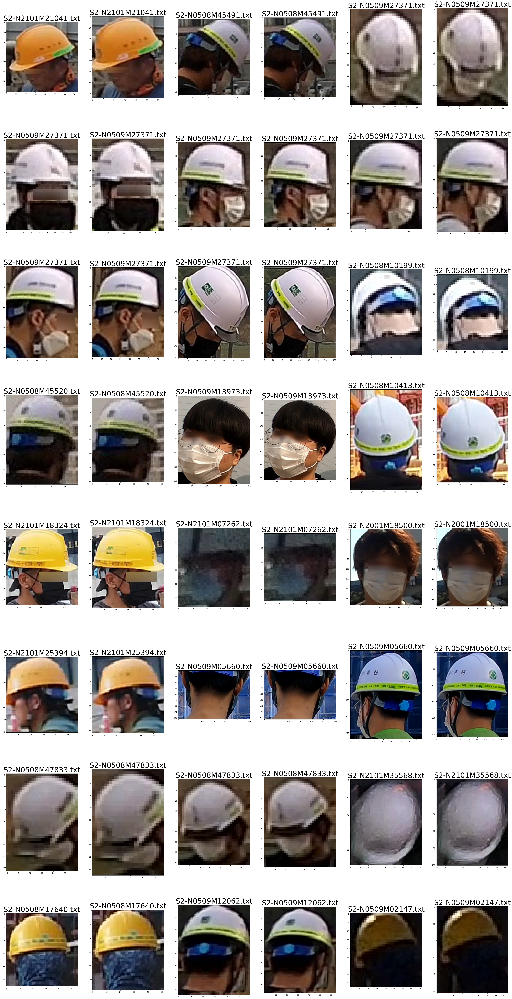

In [94]:


alpha = 24* 1


# random_indice = list(range(len(nameboxes)))
# random.seed(42)
# random.shuffle(random_indice)

plt.figure(figsize=(50,100))
for num in range(24):
    plotnum = num *2
    plt.subplot(8,6,plotnum+1)
    plt.title(checking_df.loc[num+alpha,'filename'],fontdict = {'fontsize' : 40})
    plt.imshow(lab_cropped_img[num+alpha])

    plt.subplot(8,6,plotnum+2)
    plt.title(checking_df.loc[num+alpha,'filename'],fontdict = {'fontsize' : 40})
    plt.imshow(pred_cropped_img[num+alpha])

In [20]:
nohat_df

,Unnamed: 0,cls,path,resolution,width,height,wperh,origin_path
0,0,8,S2-N0508M47833.txt,45,41,50,0.820000,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
1,1,8,S2-N0508M47833.txt,73,63,84,0.750000,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
2,2,8,S2-N0508M47833.txt,58,51,65,0.784615,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
3,3,8,S2-N0508M47833.txt,38,35,42,0.833333,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
4,4,8,S2-N0508M47833.txt,37,32,42,0.761905,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
...,...,...,...,...,...,...,...,...
222152,222152,8,S2-N2101M33163.txt,70,64,77,0.831169,[라벨]10.주차장/고양스타필드
222153,222153,8,S2-N2101M33163.txt,90,81,101,0.801980,[라벨]10.주차장/고양스타필드
222154,222154,8,S2-N0508M17283.txt,129,124,134,0.925373,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
222155,222155,8,S2-N0508M17283.txt,99,90,108,0.833333,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사


In [21]:
head_df = df.loc[(df.loc[:,'cls'] == 7) | (df.loc[:,'cls'] == 8)]

In [22]:
head_df.reset_index(drop=True,inplace=True)

In [23]:
head_df

,Unnamed: 0,cls,path,resolution,width,height,wperh,origin_path
0,3136497,7,S2-N1901M18386.txt,204,186,223,0.834081,[라벨]1.공동주택/서대문
1,3136498,7,S2-N0508M36428.txt,112,98,129,0.759690,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
2,3136499,7,S2-N0508M36428.txt,98,91,106,0.858491,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
3,3136500,7,S2-N0509M55455.txt,56,55,58,0.948276,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
4,3136501,7,S2-N0509M55455.txt,82,80,85,0.941176,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
...,...,...,...,...,...,...,...,...
1338668,4475165,8,S2-N2101M33163.txt,70,64,77,0.831169,[라벨]10.주차장/고양스타필드
1338669,4475166,8,S2-N2101M33163.txt,90,81,101,0.801980,[라벨]10.주차장/고양스타필드
1338670,4475167,8,S2-N0508M17283.txt,129,124,134,0.925373,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
1338671,4475168,8,S2-N0508M17283.txt,99,90,108,0.833333,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사


In [120]:
import shutil
dir  = '../../../datasets/aihub_safety/human_car_ver2/images/'
for i in tqdm(range(len(head_df))):
    shutil.copy(dir + head_df.loc[i,'path'][:-4] + '.jpg', '../../../temp/yolov7/test_images/head')

100%|██████████| 1338673/1338673 [21:57<00:00, 1015.87it/s]


In [24]:
pred_head = glob('../../../temp/yolov7/test_images/result_head/exp/labels/*')

In [25]:
len(pred_head)

595859

In [26]:
pred_head[:3]

['../../../temp/yolov7/test_images/result_head/exp/labels/S2-N1105M09035.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N1901M02004.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N1001M00603.txt']

In [27]:
head_df

,Unnamed: 0,cls,path,resolution,width,height,wperh,origin_path
0,3136497,7,S2-N1901M18386.txt,204,186,223,0.834081,[라벨]1.공동주택/서대문
1,3136498,7,S2-N0508M36428.txt,112,98,129,0.759690,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
2,3136499,7,S2-N0508M36428.txt,98,91,106,0.858491,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
3,3136500,7,S2-N0509M55455.txt,56,55,58,0.948276,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
4,3136501,7,S2-N0509M55455.txt,82,80,85,0.941176,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
...,...,...,...,...,...,...,...,...
1338668,4475165,8,S2-N2101M33163.txt,70,64,77,0.831169,[라벨]10.주차장/고양스타필드
1338669,4475166,8,S2-N2101M33163.txt,90,81,101,0.801980,[라벨]10.주차장/고양스타필드
1338670,4475167,8,S2-N0508M17283.txt,129,124,134,0.925373,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
1338671,4475168,8,S2-N0508M17283.txt,99,90,108,0.833333,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사


In [28]:
head_df = head_df.iloc[:,1:]

In [29]:
head_df

,cls,path,resolution,width,height,wperh,origin_path
0,7,S2-N1901M18386.txt,204,186,223,0.834081,[라벨]1.공동주택/서대문
1,7,S2-N0508M36428.txt,112,98,129,0.759690,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
2,7,S2-N0508M36428.txt,98,91,106,0.858491,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
3,7,S2-N0509M55455.txt,56,55,58,0.948276,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
4,7,S2-N0509M55455.txt,82,80,85,0.941176,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
...,...,...,...,...,...,...,...
1338668,8,S2-N2101M33163.txt,70,64,77,0.831169,[라벨]10.주차장/고양스타필드
1338669,8,S2-N2101M33163.txt,90,81,101,0.801980,[라벨]10.주차장/고양스타필드
1338670,8,S2-N0508M17283.txt,129,124,134,0.925373,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
1338671,8,S2-N0508M17283.txt,99,90,108,0.833333,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사


In [30]:
head_df.sort_values('path')

,cls,path,resolution,width,height,wperh,origin_path
444366,7,S2-N0002M00003.txt,62,54,71,0.760563,[라벨]1.공동주택/동탄
69690,7,S2-N0002M00005.txt,75,65,86,0.755814,[라벨]1.공동주택/동탄
383552,7,S2-N0002M00138.txt,56,55,58,0.948276,[라벨]1.공동주택/동탄
913905,7,S2-N0002M00162.txt,54,56,53,1.056604,[라벨]1.공동주택/동탄
740471,7,S2-N0002M00164.txt,58,55,62,0.887097,[라벨]1.공동주택/동탄
...,...,...,...,...,...,...,...
960707,7,S2-O1302M00694.txt,214,197,232,0.849138,[라벨]2.공연장/부산 오페라 하우스 신축공사
8831,7,S2-O1302M00695.txt,246,238,255,0.933333,[라벨]2.공연장/부산 오페라 하우스 신축공사
348789,7,S2-O1302M00696.txt,309,275,347,0.792507,[라벨]2.공연장/부산 오페라 하우스 신축공사
96386,7,S2-O1302M00697.txt,175,146,210,0.695238,[라벨]2.공연장/부산 오페라 하우스 신축공사


In [31]:
pred_head.sort()
pred_head

['../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00003.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00005.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00138.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00162.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00164.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00204.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00205.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00206.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00221.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00222.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00223.txt',
 '../../../temp/yolov7/test_images/result_head/exp/labels/S2-N0002M00224.txt',
 '../../../temp/yolov7/test_images/result_head/exp/l

In [32]:
head_df.sort_values('path',inplace=True)

In [33]:
# df_index = 0

# for i in pred_head:
#     with open(i, 'r') as f:
#         pred_datas = f.readlines()
    
#     lab_file = '../../../datasets/aihub_safety/human_car_ver2/labels/' + os.path.basename(i)

#     with open(lab_file, 'r') as f:
#         lab_datas = f.readlines()

#     for 





In [222]:

# [filename , lab_cls, pred_cls, lab_xyxy, pred_xyxy, iou ]
def comp_predlab(pred_head,return_dict,j):
    list01 = []

    for i in tqdm(pred_head):
    # if len(nohat_df.loc[nohat_df.loc[:,'path'] == os.path.basename(i)]):
        with open(lab_dir + os.path.basename(i), 'r') as f:
            lab_datas = f.readlines()
        
        with open(i, 'r') as f:
            pred_datas = f.readlines()

        for pred_data in pred_datas:
            pred_cls = pred_data.split(' ')[0]
            # if pred_cls in ['5','6','7','8']:
            for lab_data in lab_datas:
                lab_cls = lab_data.split(' ')[0]
                if lab_cls in ['6','7']:
                    pred_xyxy = xywh2xyxy(pred_data.split(' ')[1:])
                    lab_xyxy = xywh2xyxy(lab_data.split(' ')[1:])
                    
                    iou_value = iou(pred_xyxy,lab_xyxy)
                    if iou_value >= 0.5:
                        list01.append([os.path.basename(i),lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou_value])
        
    return_dict[j] = list01
    # results[j] = list01
    # print(len(list01))
                            

In [223]:
with open(pred_head[0],'r') as f:
    datas = f.readlines()
datas

['4 0.643229 0.383796 0.0479167 0.112037\n',
 '17 0.561719 0.0949074 0.0796875 0.189815\n',
 '10 0.616667 0.32037 0.482292 0.566667\n']

In [224]:
n = 12
end_num = len(pred_head)
indice = list(range(0,end_num,end_num//12))
indice[-1] = end_num

In [225]:
from threading import Thread
from multiprocessing import Process,Manager

In [226]:
results = [None] * n 
threads = [None] * n

manager = Manager()
return_dict = manager.dict()

for i in range(n):
    temp_list = pred_head[indice[i]:indice[i+1]]
    threads[i] = Process(target=comp_predlab, args=(temp_list,return_dict,i))
    threads[i].start()

for i in range(n):
    threads[i].join()



100%|██████████| 49654/49654 [00:09<00:00, 5441.80it/s] 


In [227]:
type(return_dict)
return_dict.keys()

[10, 8, 11, 7, 9, 6, 2, 3, 0, 1, 4, 5]

In [228]:
result = []
for i in range(n):
    result += return_dict[i]

In [229]:
print(len(result))

1072721


In [230]:
print(len(result))

1072721


In [231]:
comp_head_df = pd.DataFrame(result, columns=('filename' , 'lab_cls', 'pred_cls', 'lab_xyxy', 'pred_xyxy', 'iou'))

In [244]:
checking_df2 = comp_head_df.loc[(comp_head_df.loc[:,'lab_cls'] == '6') & (comp_head_df.loc[:,'pred_cls'] != '6')]
checking_df2.reset_index(drop=True, inplace=True)

In [245]:
checking_df2

,filename,lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou
0,S2-N0106M00607.txt,6,7,"[0.6479166666666667, 0.6574074074074074, 0.697...","[0.6484369999999999, 0.6537035, 0.698437, 0.76...",0.940919
1,S2-N0106M00607.txt,6,7,"[0.2484375, 0.3694444444444444, 0.290104166666...","[0.24947890000000003, 0.36759245, 0.2895831000...",0.932581
2,S2-N0106M00831.txt,6,7,"[0.32447916666666665, 0.38055555555555554, 0.3...","[0.329167, 0.38055574999999997, 0.366666999999...",0.774418
3,S2-N0106M01338.txt,6,7,"[0.521875, 0.18148148148148147, 0.569791666666...","[0.5218746000000001, 0.1824075, 0.5723954, 0.2...",0.940825
4,S2-N0106M03600.txt,6,7,"[0.3104166666666667, 0.2990740740740741, 0.382...","[0.3114581, 0.302778, 0.3838539, 0.44999999999...",0.904351
...,...,...,...,...,...,...
27747,S2-O1301M03776.txt,6,4,"[0.028124999999999997, 0.5277777777777777, 0.2...","[0.03203150000000002, 0.5472220000000001, 0.22...",0.924716
27748,S2-O1301M03782.txt,6,4,"[0.24609375000000003, 0.35694444444444445, 0.3...","[0.255469, 0.35, 0.357813, 0.606944]",0.857039
27749,S2-O1301M03784.txt,6,4,"[0.246875, 0.5597222222222222, 0.3929687500000...","[0.24453049999999998, 0.572222, 0.3898435, 0.8...",0.911049
27750,S2-O1301M04081.txt,6,7,"[0.044531249999999994, 0.5555555555555556, 0.0...","[0.041406200000000004, 0.5527774999999999, 0.0...",0.905760


In [234]:
img_dir = '../../../datasets/aihub_safety/human_car_ver2/images/'

lab_cropped_img = []
pred_cropped_img = []

for i in range(len(checking_df2)):
    img = cv2.imread(img_dir + checking_df2.loc[i,'filename'][:-4] + '.jpg')[...,::-1]
    w,h = img.shape[1],img.shape[0]
    
    lab_xyxy = de_normalizing(checking_df2.loc[i,'lab_xyxy'],w,h)
    pred_xyxy = de_normalizing(checking_df2.loc[i,'pred_xyxy'],w,h)

    lab_cropped_img.append(img[lab_xyxy[1]:lab_xyxy[3]+1,lab_xyxy[0]:lab_xyxy[2]+1,:])
    pred_cropped_img.append(img[pred_xyxy[1]:pred_xyxy[3]+1,pred_xyxy[0]:pred_xyxy[2]+1,:])

    if i == 200:
        break

In [235]:
import random
random.seed(42)
random.shuffle(lab_cropped_img)
random.seed(42)
random.shuffle(pred_cropped_img)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

In [246]:
checking_df2.loc[:,'pred_cls'].value_counts()

7     27164
4       225
0       147
1       109
16       48
8        23
10       11
11        8
15        5
17        4
9         3
12        2
18        2
14        1
Name: pred_cls, dtype: int64

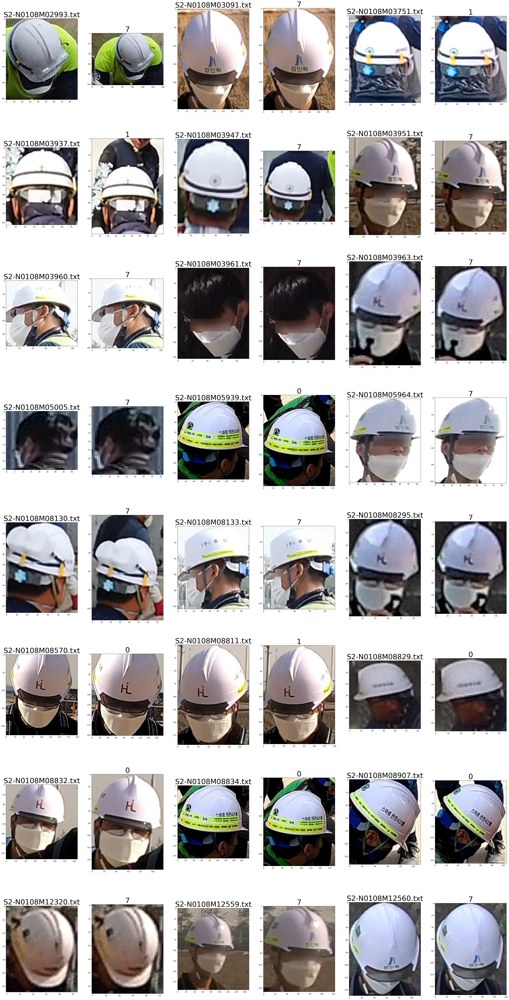

In [237]:
# 레이블에서 안전모 썻다는 데 AI 가 안썼따고 예측한경우

alpha = 24* 2


# random_indice = list(range(len(nameboxes)))
# random.seed(42)
# random.shuffle(random_indice)

plt.figure(figsize=(50,100))
for num in range(24):
    plotnum = num *2
    plt.subplot(8,6,plotnum+1)
    plt.title(checking_df2.loc[num+alpha,'filename'],fontdict = {'fontsize' : 40})
    plt.imshow(lab_cropped_img[num+alpha])

    plt.subplot(8,6,plotnum+2)
    plt.title(checking_df2.loc[num+alpha,'pred_cls'],fontdict = {'fontsize' : 40})
    plt.imshow(pred_cropped_img[num+alpha])

In [239]:
len(comp_head_df.loc[comp_head_df.loc[:,'lab_cls'] == '7'])

195891

In [247]:

comp_head_df

,filename,lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou
0,S2-N0002M00162.txt,6,6,"[0.2869791666666667, 0.14814814814814814, 0.31...","[0.28854199999999997, 0.14907410000000001, 0.3...",0.777636
1,S2-N0002M00164.txt,6,6,"[0.371875, 0.24444444444444446, 0.399999999999...","[0.37135385000000004, 0.24444419999999997, 0.4...",0.902542
2,S2-N0002M00204.txt,6,6,"[0.5552083333333333, 0.3462962962962963, 0.578...","[0.55729175, 0.35277795, 0.5776042499999999, 0...",0.752779
3,S2-N0002M00205.txt,6,6,"[0.7036458333333333, 0.2, 0.7583333333333333, ...","[0.7041668999999999, 0.2009255, 0.7630211, 0.3...",0.891727
4,S2-N0002M00206.txt,7,7,"[0.8687499999999999, 0.3509259259259259, 0.898...","[0.86822865, 0.35092545, 0.89739535, 0.41203655]",0.934317
...,...,...,...,...,...,...
1072716,S2-O1302M00694.txt,6,6,"[0.271875, 0.37916666666666665, 0.425000000000...","[0.272656, 0.3777775, 0.426562, 0.6861105]",0.938584
1072717,S2-O1302M00695.txt,6,6,"[0.31953125, 0.22777777777777777, 0.5046875, 0...","[0.31875, 0.227778, 0.502344, 0.575]",0.967775
1072718,S2-O1302M00696.txt,6,6,"[0.35000000000000003, 0.44305555555555554, 0.4...","[0.3484375, 0.44305549999999994, 0.49375050000...",0.874241
1072719,S2-O1302M00697.txt,6,6,"[0.3328125, 0.35138888888888886, 0.44609375, 0...","[0.3320305, 0.3513885, 0.44609350000000003, 0....",0.893966


In [254]:
del_list_df= comp_head_df.loc[((comp_head_df.loc[:,'lab_cls'] == '6') & (comp_head_df.loc[:,'pred_cls'] == '7')) | ((comp_head_df.loc[:,'lab_cls'] == '7') & (comp_head_df.loc[:,'pred_cls'] == '6'))].reset_index(drop=True)

In [258]:
df = df.iloc[:,1:]

In [259]:
del_list_df

,filename,lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou
0,S2-N0106M00153.txt,7,6,"[0.6494791666666666, 0.4138888888888889, 0.680...","[0.6510415, 0.4129631, 0.6791665, 0.4657409]",0.811298
1,S2-N0106M00155.txt,7,6,"[0.5322916666666666, 0.44351851851851853, 0.56...","[0.52968735, 0.4435184, 0.56302065, 0.5037036]",0.822597
2,S2-N0106M00167.txt,7,6,"[0.7411458333333333, 0.7157407407407408, 0.794...","[0.7442708499999999, 0.7166668, 0.79947915, 0....",0.841813
3,S2-N0106M00548.txt,7,6,"[0.40885416666666663, 0.35648148148148145, 0.4...","[0.41093715000000003, 0.2805555, 0.49322885, 0...",0.573109
4,S2-N0106M00554.txt,7,6,"[0.3796875, 0.3824074074074074, 0.468229166666...","[0.37864565, 0.38425899999999996, 0.47031235, ...",0.939130
...,...,...,...,...,...,...
43495,S2-O1301M01895.txt,7,6,"[0.18984375, 0.024999999999999994, 0.38828125,...","[0.19140649999999998, 0.004166500000000017, 0....",0.919740
43496,S2-O1301M01897.txt,7,6,"[0.33359375, 0.002777777777777768, 0.5078125, ...","[0.3304685, 0.006944499999999992, 0.5085935, 0...",0.944673
43497,S2-O1301M01922.txt,7,6,"[0.90625, 0.0, 0.9765625, 0.1388888888888889]","[0.90937475, -1.0000000000287557e-07, 0.979687...",0.906222
43498,S2-O1301M04081.txt,6,7,"[0.044531249999999994, 0.5555555555555556, 0.0...","[0.041406200000000004, 0.5527774999999999, 0.0...",0.905760


In [261]:
deleted_df = df.copy()

In [264]:
df

,cls,path,resolution,width,height,wperh,origin_path
0,1,S2-N0508M47833.txt,91,70,119,0.588235,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
1,1,S2-N0508M47833.txt,68,61,75,0.813333,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
2,1,S2-N0508M47833.txt,41,26,65,0.400000,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
3,1,S2-N0508M47833.txt,138,99,192,0.515625,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
4,1,S2-N0508M47833.txt,104,68,159,0.427673,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
...,...,...,...,...,...,...,...
5216745,19,S2-N2105M41828.txt,800,1060,604,1.754967,[라벨]10.주차장/고양스타필드
5216746,19,S2-N2103M71858.txt,709,1207,416,2.901442,[라벨]10.주차장/고양스타필드
5216747,19,S2-N2103M57265.txt,502,680,370,1.837838,[라벨]10.주차장/고양스타필드
5216748,19,S2-N2105M46001.txt,630,949,418,2.270335,[라벨]10.주차장/고양스타필드


In [266]:
deleted_df.sort_values('path',inplace=True)

In [267]:
del_list_df.sort_values('filename',inplace=True)

In [273]:
del_list_df

,filename,lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou
0,S2-N0106M00153.txt,7,6,"[0.6494791666666666, 0.4138888888888889, 0.680...","[0.6510415, 0.4129631, 0.6791665, 0.4657409]",0.811298
1,S2-N0106M00155.txt,7,6,"[0.5322916666666666, 0.44351851851851853, 0.56...","[0.52968735, 0.4435184, 0.56302065, 0.5037036]",0.822597
2,S2-N0106M00167.txt,7,6,"[0.7411458333333333, 0.7157407407407408, 0.794...","[0.7442708499999999, 0.7166668, 0.79947915, 0....",0.841813
3,S2-N0106M00548.txt,7,6,"[0.40885416666666663, 0.35648148148148145, 0.4...","[0.41093715000000003, 0.2805555, 0.49322885, 0...",0.573109
4,S2-N0106M00554.txt,7,6,"[0.3796875, 0.3824074074074074, 0.468229166666...","[0.37864565, 0.38425899999999996, 0.47031235, ...",0.939130
...,...,...,...,...,...,...
43495,S2-O1301M01895.txt,7,6,"[0.18984375, 0.024999999999999994, 0.38828125,...","[0.19140649999999998, 0.004166500000000017, 0....",0.919740
43496,S2-O1301M01897.txt,7,6,"[0.33359375, 0.002777777777777768, 0.5078125, ...","[0.3304685, 0.006944499999999992, 0.5085935, 0...",0.944673
43497,S2-O1301M01922.txt,7,6,"[0.90625, 0.0, 0.9765625, 0.1388888888888889]","[0.90937475, -1.0000000000287557e-07, 0.979687...",0.906222
43498,S2-O1301M04081.txt,6,7,"[0.044531249999999994, 0.5555555555555556, 0.0...","[0.041406200000000004, 0.5527774999999999, 0.0...",0.905760


In [282]:
deleted_df.reset_index(drop=True, inplace=True)

In [283]:
del_list_df.loc[0,'filename'] 

'S2-N0106M00153.txt'

In [317]:

deleted_df.loc[deleted_df.loc[:,'path'] == del_list_df.loc[10627,'filename'] ]

,cls,path,resolution,width,height,wperh,origin_path
1804551,5,S2-N0508M19583.txt,110,114,107,1.065421,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
1804552,7,S2-N0508M19583.txt,109,113,105,1.076190,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사
1804553,1,S2-N0508M19583.txt,148,172,127,1.354331,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사


In [316]:

deleted_df.loc[deleted_df.loc[:,'path'] == del_list_df.loc[10626,'filename'] ]

,cls,path,resolution,width,height,wperh,origin_path
1804550,7,S2-N0508M19582.txt,132,146,120,1.216667,[라벨]1.공동주택/하남감일 A-7BL 11공구 아파트 신축공사


In [ ]:
print(len(result))

1072721


In [296]:
del_list_df[1:10]

,filename,lab_cls,pred_cls,lab_xyxy,pred_xyxy,iou
1,S2-N0106M00155.txt,7,6,"[0.5322916666666666, 0.44351851851851853, 0.56...","[0.52968735, 0.4435184, 0.56302065, 0.5037036]",0.822597
2,S2-N0106M00167.txt,7,6,"[0.7411458333333333, 0.7157407407407408, 0.794...","[0.7442708499999999, 0.7166668, 0.79947915, 0....",0.841813
3,S2-N0106M00548.txt,7,6,"[0.40885416666666663, 0.35648148148148145, 0.4...","[0.41093715000000003, 0.2805555, 0.49322885, 0...",0.573109
4,S2-N0106M00554.txt,7,6,"[0.3796875, 0.3824074074074074, 0.468229166666...","[0.37864565, 0.38425899999999996, 0.47031235, ...",0.939130
5,S2-N0106M00594.txt,7,6,"[0.3807291666666667, 0.7018518518518518, 0.403...","[0.38072965, 0.7018518, 0.40364635, 0.7462962]",0.886939
6,S2-N0106M00607.txt,6,7,"[0.6479166666666667, 0.6574074074074074, 0.697...","[0.6484369999999999, 0.6537035, 0.698437, 0.76...",0.940919
7,S2-N0106M00607.txt,6,7,"[0.2484375, 0.3694444444444444, 0.290104166666...","[0.24947890000000003, 0.36759245, 0.2895831000...",0.932581
8,S2-N0106M00621.txt,7,6,"[0.22395833333333334, 0.22222222222222227, 0.3...","[0.22447899999999998, 0.21759250000000002, 0.3...",0.949475
9,S2-N0106M00623.txt,7,6,"[0.21458333333333335, 0.5222222222222223, 0.29...","[0.21093710000000002, 0.5212965, 0.30208290000...",0.838117


In [319]:
df_index = 0
del_list = []
for i in tqdm(range(len(del_list_df))):
    print(i)

    if (i != 0):
        if (del_list_df.loc[i,'filename']  == del_list_df.loc[i-1,'filename']):
            continue
        
    switch = True
    if del_list_df.loc[i,'filename'] != deleted_df.loc[df_index,'path']:
        while (switch): 
            df_index +=1
            if del_list_df.loc[i,'filename'] == deleted_df.loc[df_index,'path']:
                break
    
    while True:
        if del_list_df.loc[i,'filename'] == deleted_df.loc[df_index,'path']:
            del_list.append(df_index) 
            df_index +=1
        else:
            # df_index +=1
            break



  0%|          | 43/43500 [00:00<01:52, 387.36it/s]

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44


  0%|          | 119/43500 [00:00<05:14, 137.97it/s]

45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139


  0%|          | 171/43500 [00:01<04:29, 160.97it/s]

140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179


  0%|          | 215/43500 [00:01<04:08, 173.89it/s]

180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229


  1%|          | 295/43500 [00:01<02:44, 262.64it/s]

230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321


  1%|          | 368/43500 [00:01<02:20, 306.68it/s]

322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370
371
372
373
374
375
376
377
378
379
380
381
382
383
384
385
386
387
388
389
390
391
392
393
394
395
396
397
398
399
400
401
402
403
404
405
406
407
408
409
410
411
412
413
414
415
416
417
418
419
420
421
422
423
424
425
426
427
428
429
430
431
432
433
434
435
436
437
438
439
440
441
442
443
444
445
446
447
448
449
450
451
452
453
454


  1%|          | 498/43500 [00:02<02:05, 341.31it/s]

455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491
492
493
494
495
496
497
498
499
500
501
502
503
504
505
506
507
508
509
510
511


  1%|▏         | 585/43500 [00:02<01:55, 370.87it/s]

512
513
514
515
516
517
518
519
520
521
522
523
524
525
526
527
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549
550
551
552
553
554
555
556
557
558
559
560
561
562
563
564
565
566
567
568
569
570
571
572
573
574
575
576
577
578
579
580
581
582
583
584
585
586
587
588
589
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
606
607
608
609
610
611
612
613
614
615
616
617
618
619
620
621
622
623
624
625
626
627
628
629
630
631
632
633
634
635
636
637
638
639
640
641
642
643
644
645
646
647
648
649
650
651
652
653
654
655
656
657
658
659
660
661
662
663
664
665
666
667
668
669
670
671
672
673
674
675
676
677
678
679
680
681
682
683
684
685
686
687
688
689
690
691
692
693
694
695
696
697
698
699
700
701
702
703
704
705
706
707
708
709
710
711
712
713
714
715
716
717
718
719
720
721
722
723
724
725
726
727
728
729
730
731
732
733
734
735
736
737
738
739
740
741
742
743
744
745
746
747
748


  2%|▏         | 792/43500 [00:02<00:55, 775.45it/s]

749
750
751
752
753
754
755
756
757
758
759
760
761
762
763
764
765
766
767
768
769
770
771
772
773
774
775
776
777
778
779
780
781
782
783
784
785
786
787
788
789
790
791
792
793
794
795
796
797
798
799
800
801
802
803
804
805
806
807
808
809
810
811
812
813
814
815
816
817
818
819
820
821
822
823
824
825
826
827
828
829
830
831
832
833
834
835
836
837
838
839
840
841
842
843
844
845
846
847
848
849
850
851
852
853
854
855
856
857
858
859
860
861
862
863
864
865
866
867
868
869


  2%|▏         | 937/43500 [00:03<01:41, 419.26it/s]

870
871
872
873
874
875
876
877
878
879
880
881
882
883
884
885
886
887
888
889
890
891
892
893
894
895
896
897
898
899
900
901
902
903
904
905
906
907
908
909
910
911
912
913
914
915
916
917
918
919
920
921
922
923
924
925
926
927
928
929
930
931
932
933
934
935
936
937
938
939
940
941
942
943
944
945
946
947
948
949
950
951
952
953
954
955
956
957
958
959
960
961
962
963


  2%|▏         | 994/43500 [00:03<02:04, 340.05it/s]

964
965
966
967
968
969
970
971
972
973
974
975
976
977
978
979
980
981
982
983
984
985
986
987
988
989
990
991
992
993
994
995
996
997
998
999
1000
1001
1002
1003
1004
1005
1006
1007
1008
1009
1010
1011
1012
1013
1014
1015
1016
1017
1018
1019
1020
1021
1022
1023
1024
1025
1026
1027
1028
1029
1030
1031
1032
1033
1034


  2%|▏         | 1040/43500 [00:03<03:06, 227.34it/s]

1035
1036
1037
1038
1039
1040
1041
1042
1043
1044
1045
1046
1047


  3%|▎         | 1172/43500 [00:04<02:01, 348.24it/s]

1048
1049
1050
1051
1052
1053
1054
1055
1056
1057
1058
1059
1060
1061
1062
1063
1064
1065
1066
1067
1068
1069
1070
1071
1072
1073
1074
1075
1076
1077
1078
1079
1080
1081
1082
1083
1084
1085
1086
1087
1088
1089
1090
1091
1092
1093
1094
1095
1096
1097
1098
1099
1100
1101
1102
1103
1104
1105
1106
1107
1108
1109
1110
1111
1112
1113
1114
1115
1116
1117
1118
1119
1120
1121
1122
1123
1124
1125
1126
1127
1128
1129
1130
1131
1132
1133
1134
1135
1136
1137
1138
1139
1140
1141
1142
1143
1144
1145
1146
1147
1148
1149
1150
1151
1152
1153
1154
1155
1156
1157
1158
1159
1160
1161
1162
1163
1164
1165
1166
1167
1168
1169
1170
1171
1172
1173
1174
1175
1176
1177
1178
1179
1180
1181
1182
1183
1184
1185
1186
1187
1188
1189
1190
1191
1192
1193
1194
1195
1196
1197
1198
1199
1200
1201
1202
1203
1204
1205
1206
1207
1208
1209
1210
1211
1212
1213
1214
1215
1216
1217
1218
1219


  3%|▎         | 1265/43500 [00:04<02:38, 267.06it/s]

1220
1221
1222
1223
1224
1225
1226
1227
1228
1229
1230
1231
1232
1233
1234
1235
1236
1237
1238
1239
1240
1241
1242
1243
1244
1245
1246
1247
1248
1249
1250
1251
1252
1253
1254
1255
1256
1257
1258
1259
1260
1261
1262
1263
1264
1265
1266
1267
1268
1269
1270


  3%|▎         | 1338/43500 [00:04<02:40, 263.25it/s]

1271
1272
1273
1274
1275
1276
1277
1278
1279
1280
1281
1282
1283
1284
1285
1286
1287
1288
1289
1290
1291
1292
1293
1294
1295
1296
1297
1298
1299
1300
1301
1302
1303
1304
1305
1306
1307
1308
1309
1310
1311
1312
1313
1314
1315
1316
1317
1318
1319
1320
1321
1322
1323
1324
1325
1326
1327
1328
1329
1330
1331
1332
1333
1334
1335
1336
1337
1338
1339
1340


  3%|▎         | 1370/43500 [00:05<03:12, 218.99it/s]

1341
1342
1343
1344
1345
1346
1347
1348
1349
1350
1351
1352
1353
1354
1355
1356
1357
1358
1359
1360
1361
1362
1363
1364
1365
1366
1367
1368
1369
1370
1371
1372
1373
1374
1375
1376
1377
1378
1379
1380
1381
1382
1383
1384
1385
1386
1387
1388
1389
1390
1391
1392
1393
1394
1395
1396
1397
1398
1399
1400
1401
1402
1403
1404
1405
1406
1407
1408
1409
1410
1411
1412
1413
1414
1415
1416
1417
1418
1419
1420
1421
1422
1423
1424


  3%|▎         | 1475/43500 [00:05<01:54, 367.10it/s]

1425
1426
1427
1428
1429
1430
1431
1432
1433
1434
1435
1436
1437
1438
1439
1440
1441
1442
1443
1444
1445
1446
1447
1448
1449
1450
1451
1452
1453
1454
1455
1456
1457
1458
1459
1460
1461
1462
1463
1464
1465
1466
1467
1468
1469
1470
1471
1472
1473
1474
1475
1476
1477
1478
1479
1480
1481
1482
1483
1484
1485
1486
1487
1488
1489
1490
1491


  4%|▎         | 1524/43500 [00:05<02:35, 269.47it/s]

1492
1493
1494
1495
1496
1497
1498
1499
1500
1501
1502
1503
1504
1505
1506
1507
1508
1509
1510
1511
1512
1513
1514
1515
1516
1517
1518
1519
1520
1521
1522
1523
1524
1525
1526
1527
1528
1529
1530
1531
1532
1533
1534
1535
1536
1537
1538
1539
1540
1541
1542
1543
1544
1545
1546
1547
1548
1549
1550
1551
1552
1553
1554
1555
1556
1557


  4%|▎         | 1563/43500 [00:05<02:25, 287.87it/s]

1558
1559
1560
1561
1562
1563
1564
1565
1566
1567
1568
1569
1570
1571
1572
1573
1574
1575
1576
1577
1578
1579
1580
1581
1582
1583
1584
1585
1586
1587
1588
1589
1590
1591
1592
1593
1594
1595
1596
1597
1598
1599
1600
1601


  4%|▍         | 1632/43500 [00:06<04:06, 169.64it/s]

1602
1603
1604
1605
1606
1607
1608
1609
1610
1611
1612
1613
1614
1615
1616
1617
1618
1619
1620
1621
1622
1623
1624
1625
1626
1627
1628
1629
1630
1631
1632
1633
1634
1635
1636
1637
1638
1639
1640
1641
1642
1643
1644
1645
1646
1647
1648
1649
1650
1651
1652
1653
1654
1655
1656
1657
1658
1659


  4%|▍         | 1660/43500 [00:06<03:46, 184.92it/s]

1660
1661
1662
1663
1664
1665
1666
1667


  4%|▍         | 1686/43500 [00:06<05:04, 137.17it/s]

1668
1669
1670
1671
1672
1673
1674
1675
1676
1677
1678
1679
1680
1681
1682
1683
1684
1685
1686
1687


  4%|▍         | 1707/43500 [00:07<06:31, 106.76it/s]

1688
1689
1690
1691
1692
1693
1694
1695
1696
1697
1698
1699
1700
1701
1702
1703
1704
1705
1706
1707
1708
1709
1710
1711
1712
1713
1714
1715
1716
1717
1718


  4%|▍         | 1723/43500 [00:07<08:41, 80.06it/s] 

1719
1720
1721
1722
1723
1724
1725
1726
1727
1728
1729
1730
1731


  4%|▍         | 1817/43500 [00:07<04:38, 149.88it/s]

1732
1733
1734
1735
1736
1737
1738
1739
1740
1741
1742
1743
1744
1745
1746
1747
1748
1749
1750
1751
1752
1753
1754
1755
1756
1757
1758
1759
1760
1761
1762
1763
1764
1765
1766
1767
1768
1769
1770
1771
1772
1773
1774
1775
1776
1777
1778
1779
1780
1781
1782
1783
1784
1785
1786
1787
1788
1789
1790
1791
1792
1793
1794
1795
1796
1797
1798
1799
1800
1801
1802
1803
1804
1805
1806
1807
1808
1809
1810
1811
1812
1813
1814
1815
1816
1817
1818
1819
1820
1821
1822
1823
1824
1825
1826
1827
1828
1829
1830
1831
1832
1833


  4%|▍         | 1948/43500 [00:08<02:31, 273.96it/s]

1834
1835
1836
1837
1838
1839
1840
1841
1842
1843
1844
1845
1846
1847
1848
1849
1850
1851
1852
1853
1854
1855
1856
1857
1858
1859
1860
1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964


  5%|▍         | 1992/43500 [00:08<02:58, 232.83it/s]

1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010


  5%|▍         | 2082/43500 [00:08<02:28, 279.69it/s]

2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112


  5%|▍         | 2153/43500 [00:08<02:45, 250.44it/s]

2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156


  5%|▌         | 2183/43500 [00:09<03:12, 214.43it/s]

2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2171
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184


  5%|▌         | 2209/43500 [00:09<03:32, 194.22it/s]

2185
2186
2187
2188
2189
2190
2191
2192
2193
2194
2195
2196
2197
2198
2199
2200
2201
2202
2203
2204
2205
2206
2207
2208
2209
2210
2211
2212
2213
2214
2215
2216
2217
2218
2219
2220
2221
2222
2223


  6%|▌         | 2612/43500 [00:09<00:51, 794.47it/s]

2224
2225
2226
2227
2228
2229
2230
2231
2232
2233
2234
2235
2236
2237
2238
2239
2240
2241
2242
2243
2244
2245
2246
2247
2248
2249
2250
2251
2252
2253
2254
2255
2256
2257
2258
2259
2260
2261
2262
2263
2264
2265
2266
2267
2268
2269
2270
2271
2272
2273
2274
2275
2276
2277
2278
2279
2280
2281
2282
2283
2284
2285
2286
2287
2288
2289
2290
2291
2292
2293
2294
2295
2296
2297
2298
2299
2300
2301
2302
2303
2304
2305
2306
2307
2308
2309
2310
2311
2312
2313
2314
2315
2316
2317
2318
2319
2320
2321
2322
2323
2324
2325
2326
2327
2328
2329
2330
2331
2332
2333
2334
2335
2336
2337
2338
2339
2340
2341
2342
2343
2344
2345
2346
2347
2348
2349
2350
2351
2352
2353
2354
2355
2356
2357
2358
2359
2360
2361
2362
2363
2364
2365
2366
2367
2368
2369
2370
2371
2372
2373
2374
2375
2376
2377
2378
2379
2380
2381
2382
2383
2384
2385
2386
2387
2388
2389
2390
2391
2392
2393
2394
2395
2396
2397
2398
2399
2400
2401
2402
2403
2404
2405
2406
2407
2408
2409
2410
2411
2412
2413
2414
2415
2416
2417
2418
2419
2420
2421
2422
2423


  7%|▋         | 3000/43500 [00:09<00:35, 1152.11it/s]

2812
2813
2814
2815
2816
2817
2818
2819
2820
2821
2822
2823
2824
2825
2826
2827
2828
2829
2830
2831
2832
2833
2834
2835
2836
2837
2838
2839
2840
2841
2842
2843
2844
2845
2846
2847
2848
2849
2850
2851
2852
2853
2854
2855
2856
2857
2858
2859
2860
2861
2862
2863
2864
2865
2866
2867
2868
2869
2870
2871
2872
2873
2874
2875
2876
2877
2878
2879
2880
2881
2882
2883
2884
2885
2886
2887
2888
2889
2890
2891
2892
2893
2894
2895
2896
2897
2898
2899
2900
2901
2902
2903
2904
2905
2906
2907
2908
2909
2910
2911
2912
2913
2914
2915
2916
2917
2918
2919
2920
2921
2922
2923
2924
2925
2926
2927
2928
2929
2930
2931
2932
2933
2934
2935
2936
2937
2938
2939
2940
2941
2942
2943
2944
2945
2946
2947
2948
2949
2950
2951
2952
2953
2954
2955
2956
2957
2958
2959
2960
2961
2962
2963
2964
2965
2966
2967
2968
2969
2970
2971
2972
2973
2974
2975
2976
2977
2978
2979
2980
2981
2982
2983
2984
2985
2986
2987
2988
2989
2990
2991
2992
2993
2994
2995
2996
2997
2998
2999
3000
3001
3002
3003
3004
3005
3006
3007
3008
3009
3010
3011


  8%|▊         | 3311/43500 [00:10<00:31, 1271.46it/s]

3135
3136
3137
3138
3139
3140
3141
3142
3143
3144
3145
3146
3147
3148
3149
3150
3151
3152
3153
3154
3155
3156
3157
3158
3159
3160
3161
3162
3163
3164
3165
3166
3167
3168
3169
3170
3171
3172
3173
3174
3175
3176
3177
3178
3179
3180
3181
3182
3183
3184
3185
3186
3187
3188
3189
3190
3191
3192
3193
3194
3195
3196
3197
3198
3199
3200
3201
3202
3203
3204
3205
3206
3207
3208
3209
3210
3211
3212
3213
3214
3215
3216
3217
3218
3219
3220
3221
3222
3223
3224
3225
3226
3227
3228
3229
3230
3231
3232
3233
3234
3235
3236
3237
3238
3239
3240
3241
3242
3243
3244
3245
3246
3247
3248
3249
3250
3251
3252
3253
3254
3255
3256
3257
3258
3259
3260
3261
3262
3263
3264
3265
3266
3267
3268
3269
3270
3271
3272
3273
3274
3275
3276
3277
3278
3279
3280
3281
3282
3283
3284
3285
3286
3287
3288
3289
3290
3291
3292
3293
3294
3295
3296
3297
3298
3299
3300
3301
3302
3303
3304
3305
3306
3307
3308
3309
3310
3311
3312
3313
3314
3315
3316
3317
3318
3319
3320
3321
3322
3323
3324
3325
3326
3327
3328
3329
3330
3331
3332
3333
3334


  9%|▊         | 3703/43500 [00:10<00:26, 1499.19it/s]

3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714


 13%|█▎        | 5467/43500 [00:10<00:07, 4877.57it/s]

4509
4510
4511
4512
4513
4514
4515
4516
4517
4518
4519
4520
4521
4522
4523
4524
4525
4526
4527
4528
4529
4530
4531
4532
4533
4534
4535
4536
4537
4538
4539
4540
4541
4542
4543
4544
4545
4546
4547
4548
4549
4550
4551
4552
4553
4554
4555
4556
4557
4558
4559
4560
4561
4562
4563
4564
4565
4566
4567
4568
4569
4570
4571
4572
4573
4574
4575
4576
4577
4578
4579
4580
4581
4582
4583
4584
4585
4586
4587
4588
4589
4590
4591
4592
4593
4594
4595
4596
4597
4598
4599
4600
4601
4602
4603
4604
4605
4606
4607
4608
4609
4610
4611
4612
4613
4614
4615
4616
4617
4618
4619
4620
4621
4622
4623
4624
4625
4626
4627
4628
4629
4630
4631
4632
4633
4634
4635
4636
4637
4638
4639
4640
4641
4642
4643
4644
4645
4646
4647
4648
4649
4650
4651
4652
4653
4654
4655
4656
4657
4658
4659
4660
4661
4662
4663
4664
4665
4666
4667
4668
4669
4670
4671
4672
4673
4674
4675
4676
4677
4678
4679
4680
4681
4682
4683
4684
4685
4686
4687
4688
4689
4690
4691
4692
4693
4694
4695
4696
4697
4698
4699
4700
4701
4702
4703
4704
4705
4706
4707
4708


 17%|█▋        | 7363/43500 [00:10<00:06, 5548.03it/s]

6682
6683
6684
6685
6686
6687
6688
6689
6690
6691
6692
6693
6694
6695
6696
6697
6698
6699
6700
6701
6702
6703
6704
6705
6706
6707
6708
6709
6710
6711
6712
6713
6714
6715
6716
6717
6718
6719
6720
6721
6722
6723
6724
6725
6726
6727
6728
6729
6730
6731
6732
6733
6734
6735
6736
6737
6738
6739
6740
6741
6742
6743
6744
6745
6746
6747
6748
6749
6750
6751
6752
6753
6754
6755
6756
6757
6758
6759
6760
6761
6762
6763
6764
6765
6766
6767
6768
6769
6770
6771
6772
6773
6774
6775
6776
6777
6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881


 22%|██▏       | 9527/43500 [00:11<00:04, 7667.05it/s]

7619
7620
7621
7622
7623
7624
7625
7626
7627
7628
7629
7630
7631
7632
7633
7634
7635
7636
7637
7638
7639
7640
7641
7642
7643
7644
7645
7646
7647
7648
7649
7650
7651
7652
7653
7654
7655
7656
7657
7658
7659
7660
7661
7662
7663
7664
7665
7666
7667
7668
7669
7670
7671
7672
7673
7674
7675
7676
7677
7678
7679
7680
7681
7682
7683
7684
7685
7686
7687
7688
7689
7690
7691
7692
7693
7694
7695
7696
7697
7698
7699
7700
7701
7702
7703
7704
7705
7706
7707
7708
7709
7710
7711
7712
7713
7714
7715
7716
7717
7718
7719
7720
7721
7722
7723
7724
7725
7726
7727
7728
7729
7730
7731
7732
7733
7734
7735
7736
7737
7738
7739
7740
7741
7742
7743
7744
7745
7746
7747
7748
7749
7750
7751
7752
7753
7754
7755
7756
7757
7758
7759
7760
7761
7762
7763
7764
7765
7766
7767
7768
7769
7770
7771
7772
7773
7774
7775
7776
7777
7778
7779
7780
7781
7782
7783
7784
7785
7786
7787
7788
7789
7790
7791
7792
7793
7794
7795
7796
7797
7798
7799
7800
7801
7802
7803
7804
7805
7806
7807
7808
7809
7810
7811
7812
7813
7814
7815
7816
7817
7818


 24%|██▍       | 10630/43500 [00:11<00:03, 8532.34it/s]

10569
10570
10571
10572
10573
10574
10575
10576
10577
10578
10579
10580
10581
10582
10583
10584
10585
10586
10587
10588
10589
10590
10591
10592
10593
10594
10595
10596
10597
10598
10599
10600
10601
10602
10603
10604
10605
10606
10607
10608
10609
10610
10611
10612
10613
10614
10615
10616
10617
10618
10619
10620
10621
10622
10623
10624
10625
10626
10627
10628
10629
10630
10631
10632
10633
10634
10635
10636
10637
10638
10639
10640
10641
10642
10643
10644
10645
10646
10647
10648
10649
10650
10651
10652
10653
10654
10655
10656
10657
10658
10659
10660
10661
10662
10663
10664
10665
10666
10667
10668
10669
10670
10671
10672
10673
10674
10675
10676
10677
10678
10679
10680
10681
10682
10683
10684
10685
10686
10687
10688
10689
10690
10691
10692
10693
10694
10695
10696
10697
10698
10699
10700
10701
10702
10703
10704
10705
10706
10707
10708
10709
10710
10711
10712
10713
10714
10715
10716
10717
10718
10719
10720
10721
10722
10723
10724
10725
10726
10727
10728
10729
10730
10731
10732
10733
10734
1073

 27%|██▋       | 11555/43500 [00:11<00:09, 3500.69it/s]

11037
11038
11039
11040
11041
11042
11043
11044
11045
11046
11047
11048
11049
11050
11051
11052
11053
11054
11055
11056
11057
11058
11059
11060
11061
11062
11063
11064
11065
11066
11067
11068
11069
11070
11071
11072
11073
11074
11075
11076
11077
11078
11079
11080
11081
11082
11083
11084
11085
11086
11087
11088
11089
11090
11091
11092
11093
11094
11095
11096
11097
11098
11099
11100
11101
11102
11103
11104
11105
11106
11107
11108
11109
11110
11111
11112
11113
11114
11115
11116
11117
11118
11119
11120
11121
11122
11123
11124
11125
11126
11127
11128
11129
11130
11131
11132
11133
11134
11135
11136
11137
11138
11139
11140
11141
11142
11143
11144
11145
11146
11147
11148
11149
11150
11151
11152
11153
11154
11155
11156
11157
11158
11159
11160
11161
11162
11163
11164
11165
11166
11167
11168
11169
11170
11171
11172
11173
11174
11175
11176
11177
11178
11179
11180
11181
11182
11183
11184
11185
11186
11187
11188
11189
11190
11191
11192
11193
11194
11195
11196
11197
11198
11199
11200
11201
11202
1120

 30%|██▉       | 12925/43500 [00:12<00:07, 4107.97it/s]

12034
12035
12036
12037
12038
12039
12040
12041
12042
12043
12044
12045
12046
12047
12048
12049
12050
12051
12052
12053
12054
12055
12056
12057
12058
12059
12060
12061
12062
12063
12064
12065
12066
12067
12068
12069
12070
12071
12072
12073
12074
12075
12076
12077
12078
12079
12080
12081
12082
12083
12084
12085
12086
12087
12088
12089
12090
12091
12092
12093
12094
12095
12096
12097
12098
12099
12100
12101
12102
12103
12104
12105
12106
12107
12108
12109
12110
12111
12112
12113
12114
12115
12116
12117
12118
12119
12120
12121
12122
12123
12124
12125
12126
12127
12128
12129
12130
12131
12132
12133
12134
12135
12136
12137
12138
12139
12140
12141
12142
12143
12144
12145
12146
12147
12148
12149
12150
12151
12152
12153
12154
12155
12156
12157
12158
12159
12160
12161
12162
12163
12164
12165
12166
12167
12168
12169
12170
12171
12172
12173
12174
12175
12176
12177
12178
12179
12180
12181
12182
12183
12184
12185
12186
12187
12188
12189
12190
12191
12192
12193
12194
12195
12196
12197
12198
12199
1220

 31%|███       | 13544/43500 [00:12<00:13, 2210.45it/s]

13320
13321
13322
13323
13324
13325
13326
13327
13328
13329
13330
13331
13332
13333
13334
13335
13336
13337
13338
13339
13340
13341
13342
13343
13344
13345
13346
13347
13348
13349
13350
13351
13352
13353
13354
13355
13356
13357
13358
13359
13360
13361
13362
13363
13364
13365
13366
13367
13368
13369
13370
13371
13372
13373
13374
13375
13376
13377
13378
13379
13380
13381
13382
13383
13384
13385
13386
13387
13388
13389
13390
13391
13392
13393
13394
13395
13396
13397
13398
13399
13400
13401
13402
13403
13404
13405
13406
13407
13408
13409
13410
13411
13412
13413
13414
13415
13416
13417
13418
13419
13420
13421
13422
13423
13424
13425
13426
13427
13428
13429
13430
13431
13432
13433
13434
13435
13436
13437
13438
13439
13440
13441
13442
13443
13444
13445
13446
13447
13448
13449
13450
13451
13452
13453
13454
13455
13456
13457
13458
13459
13460
13461
13462
13463
13464
13465
13466
13467
13468
13469
13470
13471
13472
13473
13474
13475
13476
13477
13478
13479
13480
13481
13482
13483
13484
13485
1348

 33%|███▎      | 14490/43500 [00:13<00:10, 2743.72it/s]

14024
14025
14026
14027
14028
14029
14030
14031
14032
14033
14034
14035
14036
14037
14038
14039
14040
14041
14042
14043
14044
14045
14046
14047
14048
14049
14050
14051
14052
14053
14054
14055
14056
14057
14058
14059
14060
14061
14062
14063
14064
14065
14066
14067
14068
14069
14070
14071
14072
14073
14074
14075
14076
14077
14078
14079
14080
14081
14082
14083
14084
14085
14086
14087
14088
14089
14090
14091
14092
14093
14094
14095
14096
14097
14098
14099
14100
14101
14102
14103
14104
14105
14106
14107
14108
14109
14110
14111
14112
14113
14114
14115
14116
14117
14118
14119
14120
14121
14122
14123
14124
14125
14126
14127
14128
14129
14130
14131
14132
14133
14134
14135
14136
14137
14138
14139
14140
14141
14142
14143
14144
14145
14146
14147
14148
14149
14150
14151
14152
14153
14154
14155
14156
14157
14158
14159
14160
14161
14162
14163
14164
14165
14166
14167
14168
14169
14170
14171
14172
14173
14174
14175
14176
14177
14178
14179
14180
14181
14182
14183
14184
14185
14186
14187
14188
14189
1419

 34%|███▍      | 14941/43500 [00:13<00:12, 2356.53it/s]

14657
14658
14659
14660
14661
14662
14663
14664
14665
14666
14667
14668
14669
14670
14671
14672
14673
14674
14675
14676
14677
14678
14679
14680
14681
14682
14683
14684
14685
14686
14687
14688
14689
14690
14691
14692
14693
14694
14695
14696
14697
14698
14699
14700
14701
14702
14703
14704
14705
14706
14707
14708
14709
14710
14711
14712
14713
14714
14715
14716
14717
14718
14719
14720
14721
14722
14723
14724
14725
14726
14727
14728
14729
14730
14731
14732
14733
14734
14735
14736
14737
14738
14739
14740
14741
14742
14743
14744
14745
14746
14747
14748
14749
14750
14751
14752
14753
14754
14755
14756
14757
14758
14759
14760
14761
14762
14763
14764
14765
14766
14767
14768
14769
14770
14771
14772
14773
14774
14775
14776
14777
14778
14779
14780
14781
14782
14783
14784
14785
14786
14787
14788
14789
14790
14791
14792
14793
14794
14795
14796
14797
14798
14799
14800
14801
14802
14803
14804
14805
14806
14807
14808
14809
14810
14811
14812
14813
14814
14815
14816
14817
14818
14819
14820
14821
14822
1482

 36%|███▌      | 15486/43500 [00:13<00:09, 2803.38it/s]

15486
15487
15488
15489
15490
15491
15492
15493
15494
15495
15496
15497
15498
15499
15500
15501
15502
15503
15504
15505
15506
15507
15508
15509
15510
15511
15512
15513
15514
15515
15516
15517
15518
15519
15520
15521
15522
15523
15524
15525
15526
15527
15528
15529
15530
15531
15532
15533
15534
15535
15536
15537
15538
15539
15540
15541
15542
15543
15544
15545
15546
15547
15548
15549
15550
15551
15552
15553
15554
15555
15556
15557
15558
15559
15560
15561
15562
15563
15564
15565
15566
15567
15568
15569
15570
15571
15572
15573
15574
15575
15576
15577
15578
15579
15580
15581
15582
15583
15584
15585
15586
15587
15588
15589
15590
15591
15592
15593
15594
15595
15596
15597
15598
15599
15600
15601
15602
15603
15604
15605
15606
15607
15608
15609
15610
15611
15612
15613
15614
15615
15616
15617
15618
15619
15620
15621
15622
15623
15624
15625
15626
15627
15628
15629
15630
15631
15632
15633
15634
15635
15636
15637
15638
15639
15640
15641
15642
15643
15644
15645
15646
15647
15648
15649
15650
15651
1565

 37%|███▋      | 15897/43500 [00:14<00:20, 1348.05it/s]

15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
15902
15903
15904
15905
15906
15907
15908
15909
15910
15911
15912
15913
15914
15915
15916
15917
15918
15919
15920
15921
15922
15923
15924
15925
15926
15927
15928
15929
15930
15931
15932
15933
15934
15935
15936
15937
15938
15939
15940
15941
15942
15943
15944
15945
15946
15947
15948
15949
15950
15951
15952
15953
15954
15955
15956
15957
15958
15959
15960
15961
15962
15963
15964
15965
15966
15967
15968
15969
15970
15971
15972
15973
15974
15975
15976
15977
15978
15979
15980
15981
15982
15983
15984
15985
15986
15987
15988
15989
15990
15991
15992
15993
15994
15995
15996
15997
15998
15999
16000
16001
16002
16003
16004
16005
16006
16007
16008
16009
16010
16011
16012
16013
16014
16015
16016
16017
16018
16019
16020
16021
16022
16023
16024
16025
16026
16027
16028
16029
16030
16031
16032
16033
16034
16035
16036
16037
16038
16039
16040
16041
16042
16043
16044
16045
16046
16047
16048
1604

 40%|████      | 17547/43500 [00:14<00:12, 2092.49it/s]

16158
16159
16160
16161
16162
16163
16164
16165
16166
16167
16168
16169
16170
16171
16172
16173
16174
16175
16176
16177
16178
16179
16180
16181
16182
16183
16184
16185
16186
16187
16188
16189
16190
16191
16192
16193
16194
16195
16196
16197
16198
16199
16200
16201
16202
16203
16204
16205
16206
16207
16208
16209
16210
16211
16212
16213
16214
16215
16216
16217
16218
16219
16220
16221
16222
16223
16224
16225
16226
16227
16228
16229
16230
16231
16232
16233
16234
16235
16236
16237
16238
16239
16240
16241
16242
16243
16244
16245
16246
16247
16248
16249
16250
16251
16252
16253
16254
16255
16256
16257
16258
16259
16260
16261
16262
16263
16264
16265
16266
16267
16268
16269
16270
16271
16272
16273
16274
16275
16276
16277
16278
16279
16280
16281
16282
16283
16284
16285
16286
16287
16288
16289
16290
16291
16292
16293
16294
16295
16296
16297
16298
16299
16300
16301
16302
16303
16304
16305
16306
16307
16308
16309
16310
16311
16312
16313
16314
16315
16316
16317
16318
16319
16320
16321
16322
16323
1632

 42%|████▏     | 18110/43500 [00:15<00:11, 2203.68it/s]

17908
17909
17910
17911
17912
17913
17914
17915
17916
17917
17918
17919
17920
17921
17922
17923
17924
17925
17926
17927
17928
17929
17930
17931
17932
17933
17934
17935
17936
17937
17938
17939
17940
17941
17942
17943
17944
17945
17946
17947
17948
17949
17950
17951
17952
17953
17954
17955
17956
17957
17958
17959
17960
17961
17962
17963
17964
17965
17966
17967
17968
17969
17970
17971
17972
17973
17974
17975
17976
17977
17978
17979
17980
17981
17982
17983
17984
17985
17986
17987
17988
17989
17990
17991
17992
17993
17994
17995
17996
17997
17998
17999
18000
18001
18002
18003
18004
18005
18006
18007
18008
18009
18010
18011
18012
18013
18014
18015
18016
18017
18018
18019
18020
18021
18022
18023
18024
18025
18026
18027
18028
18029
18030
18031
18032
18033
18034
18035
18036
18037
18038
18039
18040
18041
18042
18043
18044
18045
18046
18047
18048
18049
18050
18051
18052
18053
18054
18055
18056
18057
18058
18059
18060
18061
18062
18063
18064
18065
18066
18067
18068
18069
18070
18071
18072
18073
1807

 43%|████▎     | 18583/43500 [00:15<00:11, 2170.32it/s]

18138
18139
18140
18141
18142
18143
18144
18145
18146
18147
18148
18149
18150
18151
18152
18153
18154
18155
18156
18157
18158
18159
18160
18161
18162
18163
18164
18165
18166
18167
18168
18169
18170
18171
18172
18173
18174
18175
18176
18177
18178
18179
18180
18181
18182
18183
18184
18185
18186
18187
18188
18189
18190
18191
18192
18193
18194
18195
18196
18197
18198
18199
18200
18201
18202
18203
18204
18205
18206
18207
18208
18209
18210
18211
18212
18213
18214
18215
18216
18217
18218
18219
18220
18221
18222
18223
18224
18225
18226
18227
18228
18229
18230
18231
18232
18233
18234
18235
18236
18237
18238
18239
18240
18241
18242
18243
18244
18245
18246
18247
18248
18249
18250
18251
18252
18253
18254
18255
18256
18257
18258
18259
18260
18261
18262
18263
18264
18265
18266
18267
18268
18269
18270
18271
18272
18273
18274
18275
18276
18277
18278
18279
18280
18281
18282
18283
18284
18285
18286
18287
18288
18289
18290
18291
18292
18293
18294
18295
18296
18297
18298
18299
18300
18301
18302
18303
1830

 44%|████▎     | 18976/43500 [00:16<00:25, 966.08it/s] 

18967
18968
18969
18970
18971
18972
18973
18974
18975
18976
18977
18978
18979
18980
18981
18982
18983
18984
18985
18986
18987
18988
18989
18990
18991
18992
18993
18994
18995
18996
18997
18998
18999
19000
19001
19002
19003
19004
19005
19006
19007
19008
19009
19010
19011
19012
19013
19014
19015
19016
19017
19018
19019
19020
19021
19022
19023
19024
19025
19026
19027
19028
19029
19030
19031
19032
19033
19034
19035
19036
19037
19038
19039
19040
19041
19042
19043
19044
19045
19046
19047
19048
19049
19050
19051
19052
19053
19054
19055
19056
19057
19058
19059
19060
19061
19062
19063
19064
19065
19066
19067
19068
19069
19070
19071
19072
19073
19074
19075
19076
19077
19078
19079
19080
19081
19082
19083
19084
19085
19086
19087
19088
19089
19090
19091
19092
19093
19094
19095
19096
19097
19098
19099
19100
19101
19102
19103
19104
19105
19106
19107
19108
19109
19110
19111
19112
19113
19114
19115
19116
19117
19118
19119
19120
19121
19122
19123
19124
19125
19126
19127


 44%|████▍     | 19261/43500 [00:16<00:25, 955.14it/s]

19128
19129
19130
19131
19132
19133
19134
19135
19136
19137
19138
19139
19140
19141
19142
19143
19144
19145
19146
19147
19148
19149
19150
19151
19152
19153
19154
19155
19156
19157
19158
19159
19160
19161
19162
19163
19164
19165
19166
19167
19168
19169
19170
19171
19172
19173
19174
19175
19176
19177
19178
19179
19180
19181
19182
19183
19184
19185
19186
19187
19188
19189
19190
19191
19192
19193
19194
19195
19196
19197
19198
19199
19200
19201
19202
19203
19204
19205
19206
19207
19208
19209
19210
19211
19212
19213
19214
19215
19216
19217
19218
19219
19220
19221
19222
19223
19224
19225
19226
19227
19228
19229
19230
19231
19232
19233
19234
19235
19236
19237
19238
19239
19240
19241
19242
19243
19244
19245
19246
19247
19248
19249
19250
19251
19252
19253
19254
19255
19256
19257
19258
19259
19260
19261
19262
19263
19264
19265
19266
19267
19268
19269
19270
19271
19272
19273
19274
19275
19276
19277
19278
19279
19280
19281
19282
19283
19284
19285
19286
19287
19288
19289
19290
19291
19292
19293
1929

 45%|████▍     | 19488/43500 [00:17<00:25, 929.58it/s]

19324
19325
19326
19327
19328
19329
19330
19331
19332
19333
19334
19335
19336
19337
19338
19339
19340
19341
19342
19343
19344
19345
19346
19347
19348
19349
19350
19351
19352
19353
19354
19355
19356
19357
19358
19359
19360
19361
19362
19363
19364
19365
19366
19367
19368
19369
19370
19371
19372
19373
19374
19375
19376
19377
19378
19379
19380
19381
19382
19383
19384
19385
19386
19387
19388
19389
19390
19391
19392
19393
19394
19395
19396
19397
19398
19399
19400
19401
19402
19403
19404
19405
19406
19407
19408
19409
19410
19411
19412
19413
19414
19415
19416
19417
19418
19419
19420
19421
19422
19423
19424
19425
19426
19427
19428
19429
19430
19431
19432
19433
19434
19435
19436
19437
19438
19439
19440
19441
19442
19443
19444
19445
19446
19447
19448
19449
19450
19451
19452
19453
19454
19455
19456
19457
19458
19459
19460
19461
19462
19463
19464
19465
19466
19467
19468
19469
19470
19471
19472
19473
19474
19475
19476
19477
19478
19479
19480
19481
19482
19483
19484
19485
19486
19487
19488
19489
1949

 45%|████▌     | 19672/43500 [00:17<00:25, 941.00it/s]

19606
19607
19608
19609
19610
19611
19612
19613
19614
19615
19616
19617
19618
19619
19620
19621
19622
19623
19624
19625
19626
19627
19628
19629
19630
19631
19632
19633
19634
19635
19636
19637
19638
19639
19640
19641
19642
19643
19644
19645
19646
19647
19648
19649
19650
19651
19652
19653
19654
19655
19656
19657
19658
19659
19660
19661
19662
19663
19664
19665
19666
19667
19668
19669
19670
19671
19672
19673
19674
19675
19676
19677
19678
19679
19680
19681
19682
19683
19684
19685
19686
19687
19688
19689
19690
19691
19692
19693
19694
19695
19696
19697
19698
19699
19700
19701
19702
19703
19704
19705
19706
19707
19708
19709
19710
19711
19712
19713
19714
19715
19716
19717
19718
19719
19720
19721
19722
19723
19724
19725
19726
19727
19728
19729
19730
19731
19732
19733
19734
19735
19736
19737
19738
19739
19740
19741
19742
19743
19744
19745
19746
19747
19748
19749
19750
19751
19752
19753
19754
19755
19756
19757
19758
19759
19760
19761
19762
19763
19764
19765
19766
19767
19768
19769
19770
19771
1977

 46%|████▌     | 19831/43500 [00:17<00:34, 692.88it/s]

19806
19807
19808
19809
19810
19811
19812
19813
19814
19815
19816
19817
19818
19819
19820
19821
19822
19823
19824
19825
19826
19827
19828
19829
19830
19831
19832
19833
19834
19835
19836
19837
19838
19839
19840
19841
19842
19843
19844
19845
19846
19847


 46%|████▌     | 19951/43500 [00:18<00:37, 633.63it/s]

19848
19849
19850
19851
19852
19853
19854
19855
19856
19857
19858
19859
19860
19861
19862
19863
19864
19865
19866
19867
19868
19869
19870
19871
19872
19873
19874
19875
19876
19877
19878
19879
19880
19881
19882
19883
19884
19885
19886
19887
19888
19889
19890
19891
19892
19893
19894
19895
19896
19897
19898
19899
19900
19901
19902
19903
19904
19905
19906
19907
19908
19909
19910
19911
19912
19913
19914
19915
19916
19917
19918
19919
19920
19921
19922
19923
19924
19925
19926
19927
19928
19929
19930
19931
19932
19933
19934
19935
19936
19937
19938
19939
19940
19941
19942
19943
19944
19945
19946
19947
19948
19949
19950
19951
19952
19953
19954
19955
19956
19957
19958
19959
19960
19961
19962
19963
19964
19965
19966
19967
19968
19969
19970
19971
19972
19973
19974
19975
19976
19977
19978
19979
19980
19981
19982
19983
19984
19985
19986
19987
19988
19989
19990
19991
19992
19993
19994
19995
19996
19997
19998
19999
20000
20001
20002
20003
20004
20005
20006
20007
20008
20009
20010
20011
20012
20013
2001

 57%|█████▋    | 24720/43500 [00:18<00:03, 5764.50it/s]

21518
21519
21520
21521
21522
21523
21524
21525
21526
21527
21528
21529
21530
21531
21532
21533
21534
21535
21536
21537
21538
21539
21540
21541
21542
21543
21544
21545
21546
21547
21548
21549
21550
21551
21552
21553
21554
21555
21556
21557
21558
21559
21560
21561
21562
21563
21564
21565
21566
21567
21568
21569
21570
21571
21572
21573
21574
21575
21576
21577
21578
21579
21580
21581
21582
21583
21584
21585
21586
21587
21588
21589
21590
21591
21592
21593
21594
21595
21596
21597
21598
21599
21600
21601
21602
21603
21604
21605
21606
21607
21608
21609
21610
21611
21612
21613
21614
21615
21616
21617
21618
21619
21620
21621
21622
21623
21624
21625
21626
21627
21628
21629
21630
21631
21632
21633
21634
21635
21636
21637
21638
21639
21640
21641
21642
21643
21644
21645
21646
21647
21648
21649
21650
21651
21652
21653
21654
21655
21656
21657
21658
21659
21660
21661
21662
21663
21664
21665
21666
21667
21668
21669
21670
21671
21672
21673
21674
21675
21676
21677
21678
21679
21680
21681
21682
21683
2168

 66%|██████▋   | 28888/43500 [00:18<00:01, 10437.79it/s]

26782
26783
26784
26785
26786
26787
26788
26789
26790
26791
26792
26793
26794
26795
26796
26797
26798
26799
26800
26801
26802
26803
26804
26805
26806
26807
26808
26809
26810
26811
26812
26813
26814
26815
26816
26817
26818
26819
26820
26821
26822
26823
26824
26825
26826
26827
26828
26829
26830
26831
26832
26833
26834
26835
26836
26837
26838
26839
26840
26841
26842
26843
26844
26845
26846
26847
26848
26849
26850
26851
26852
26853
26854
26855
26856
26857
26858
26859
26860
26861
26862
26863
26864
26865
26866
26867
26868
26869
26870
26871
26872
26873
26874
26875
26876
26877
26878
26879
26880
26881
26882
26883
26884
26885
26886
26887
26888
26889
26890
26891
26892
26893
26894
26895
26896
26897
26898
26899
26900
26901
26902
26903
26904
26905
26906
26907
26908
26909
26910
26911
26912
26913
26914
26915
26916
26917
26918
26919
26920
26921
26922
26923
26924
26925
26926
26927
26928
26929
26930
26931
26932
26933
26934
26935
26936
26937
26938
26939
26940
26941
26942
26943
26944
26945
26946
26947
2694

 70%|███████   | 30566/43500 [00:19<00:02, 6142.85it/s] 

29999
30000
30001
30002
30003
30004
30005
30006
30007
30008
30009
30010
30011
30012
30013
30014
30015
30016
30017
30018
30019
30020
30021
30022
30023
30024
30025
30026
30027
30028
30029
30030
30031
30032
30033
30034
30035
30036
30037
30038
30039
30040
30041
30042
30043
30044
30045
30046
30047
30048
30049
30050
30051
30052
30053
30054
30055
30056
30057
30058
30059
30060
30061
30062
30063
30064
30065
30066
30067
30068
30069
30070
30071
30072
30073
30074
30075
30076
30077
30078
30079
30080
30081
30082
30083
30084
30085
30086
30087
30088
30089
30090
30091
30092
30093
30094
30095
30096
30097
30098
30099
30100
30101
30102
30103
30104
30105
30106
30107
30108
30109
30110
30111
30112
30113
30114
30115
30116
30117
30118
30119
30120
30121
30122
30123
30124
30125
30126
30127
30128
30129
30130
30131
30132
30133
30134
30135
30136
30137
30138
30139
30140
30141
30142
30143
30144
30145
30146
30147
30148
30149
30150
30151
30152
30153
30154
30155
30156
30157
30158
30159
30160
30161
30162
30163
30164
3016

 76%|███████▌  | 33097/43500 [00:19<00:01, 7525.54it/s]

31126
31127
31128
31129
31130
31131
31132
31133
31134
31135
31136
31137
31138
31139
31140
31141
31142
31143
31144
31145
31146
31147
31148
31149
31150
31151
31152
31153
31154
31155
31156
31157
31158
31159
31160
31161
31162
31163
31164
31165
31166
31167
31168
31169
31170
31171
31172
31173
31174
31175
31176
31177
31178
31179
31180
31181
31182
31183
31184
31185
31186
31187
31188
31189
31190
31191
31192
31193
31194
31195
31196
31197
31198
31199
31200
31201
31202
31203
31204
31205
31206
31207
31208
31209
31210
31211
31212
31213
31214
31215
31216
31217
31218
31219
31220
31221
31222
31223
31224
31225
31226
31227
31228
31229
31230
31231
31232
31233
31234
31235
31236
31237
31238
31239
31240
31241
31242
31243
31244
31245
31246
31247
31248
31249
31250
31251
31252
31253
31254
31255
31256
31257
31258
31259
31260
31261
31262
31263
31264
31265
31266
31267
31268
31269
31270
31271
31272
31273
31274
31275
31276
31277
31278
31279
31280
31281
31282
31283
31284
31285
31286
31287
31288
31289
31290
31291
3129

 79%|███████▉  | 34269/43500 [00:23<00:09, 1012.72it/s]

34260
34261
34262
34263
34264
34265
34266
34267
34268
34269
34270
34271
34272
34273
34274
34275
34276
34277
34278
34279
34280
34281
34282
34283
34284
34285
34286
34287
34288
34289
34290
34291
34292
34293
34294
34295
34296
34297
34298
34299
34300
34301
34302
34303
34304
34305
34306
34307
34308
34309
34310
34311
34312
34313
34314
34315
34316
34317
34318
34319
34320
34321
34322
34323
34324
34325
34326
34327
34328
34329
34330
34331
34332
34333
34334
34335
34336
34337
34338
34339
34340
34341
34342
34343
34344
34345
34346
34347
34348
34349
34350
34351
34352
34353
34354
34355
34356
34357
34358
34359
34360
34361
34362
34363
34364
34365
34366
34367
34368
34369
34370
34371
34372
34373
34374
34375
34376
34377
34378
34379
34380
34381
34382
34383
34384
34385
34386
34387
34388
34389
34390
34391
34392
34393
34394
34395
34396
34397
34398
34399
34400
34401
34402
34403
34404
34405
34406
34407
34408
34409
34410
34411
34412
34413
34414
34415
34416
34417
34418
34419
34420
34421
34422
34423
34424
34425
3442

 81%|████████  | 35098/43500 [00:25<00:10, 764.44it/s] 

34646
34647
34648
34649
34650
34651
34652
34653
34654
34655
34656
34657
34658
34659
34660
34661
34662
34663
34664
34665
34666
34667
34668
34669
34670
34671
34672
34673
34674
34675
34676
34677
34678
34679
34680
34681
34682
34683
34684
34685
34686
34687
34688
34689
34690
34691
34692
34693
34694
34695
34696
34697
34698
34699
34700
34701
34702
34703
34704
34705
34706
34707
34708
34709
34710
34711
34712
34713
34714
34715
34716
34717
34718
34719
34720
34721
34722
34723
34724
34725
34726
34727
34728
34729
34730
34731
34732
34733
34734
34735
34736
34737
34738
34739
34740
34741
34742
34743
34744
34745
34746
34747
34748
34749
34750
34751
34752
34753
34754
34755
34756
34757
34758
34759
34760
34761
34762
34763
34764
34765
34766
34767
34768
34769
34770
34771
34772
34773
34774
34775
34776
34777
34778
34779
34780
34781
34782
34783
34784
34785
34786
34787
34788
34789
34790
34791
34792
34793
34794
34795
34796
34797
34798
34799
34800
34801
34802
34803
34804
34805
34806
34807
34808
34809
34810
34811
3481

 87%|████████▋ | 37788/43500 [00:25<00:03, 1749.62it/s]

35690
35691
35692
35693
35694
35695
35696
35697
35698
35699
35700
35701
35702
35703
35704
35705
35706
35707
35708
35709
35710
35711
35712
35713
35714
35715
35716
35717
35718
35719
35720
35721
35722
35723
35724
35725
35726
35727
35728
35729
35730
35731
35732
35733
35734
35735
35736
35737
35738
35739
35740
35741
35742
35743
35744
35745
35746
35747
35748
35749
35750
35751
35752
35753
35754
35755
35756
35757
35758
35759
35760
35761
35762
35763
35764
35765
35766
35767
35768
35769
35770
35771
35772
35773
35774
35775
35776
35777
35778
35779
35780
35781
35782
35783
35784
35785
35786
35787
35788
35789
35790
35791
35792
35793
35794
35795
35796
35797
35798
35799
35800
35801
35802
35803
35804
35805
35806
35807
35808
35809
35810
35811
35812
35813
35814
35815
35816
35817
35818
35819
35820
35821
35822
35823
35824
35825
35826
35827
35828
35829
35830
35831
35832
35833
35834
35835
35836
35837
35838
35839
35840
35841
35842
35843
35844
35845
35846
35847
35848
35849
35850
35851
35852
35853
35854
35855
3585

 89%|████████▉ | 38635/43500 [00:26<00:02, 2071.97it/s]

38157
38158
38159
38160
38161
38162
38163
38164
38165
38166
38167
38168
38169
38170
38171
38172
38173
38174
38175
38176
38177
38178
38179
38180
38181
38182
38183
38184
38185
38186
38187
38188
38189
38190
38191
38192
38193
38194
38195
38196
38197
38198
38199
38200
38201
38202
38203
38204
38205
38206
38207
38208
38209
38210
38211
38212
38213
38214
38215
38216
38217
38218
38219
38220
38221
38222
38223
38224
38225
38226
38227
38228
38229
38230
38231
38232
38233
38234
38235
38236
38237
38238
38239
38240
38241
38242
38243
38244
38245
38246
38247
38248
38249
38250
38251
38252
38253
38254
38255
38256
38257
38258
38259
38260
38261
38262
38263
38264
38265
38266
38267
38268
38269
38270
38271
38272
38273
38274
38275
38276
38277
38278
38279
38280
38281
38282
38283
38284
38285
38286
38287
38288
38289
38290
38291
38292
38293
38294
38295
38296
38297
38298
38299
38300
38301
38302
38303
38304
38305
38306
38307
38308
38309
38310
38311
38312
38313
38314
38315
38316
38317
38318
38319
38320
38321
38322
3832

 90%|█████████ | 39365/43500 [00:27<00:02, 1451.12it/s]

39179
39180
39181
39182
39183
39184
39185
39186
39187
39188
39189
39190
39191
39192
39193
39194
39195
39196
39197
39198
39199
39200
39201
39202
39203
39204
39205
39206
39207
39208
39209
39210
39211
39212
39213
39214
39215
39216
39217
39218
39219
39220
39221
39222
39223
39224
39225
39226
39227
39228
39229
39230
39231
39232
39233
39234
39235
39236
39237
39238
39239
39240
39241
39242
39243
39244
39245
39246
39247
39248
39249
39250
39251
39252
39253
39254
39255
39256
39257
39258
39259
39260
39261
39262
39263
39264
39265
39266
39267
39268
39269
39270
39271
39272
39273
39274
39275
39276
39277
39278
39279
39280
39281
39282
39283
39284
39285
39286
39287
39288
39289
39290
39291
39292
39293
39294
39295
39296
39297
39298
39299
39300
39301
39302
39303
39304
39305
39306
39307
39308
39309
39310
39311
39312
39313
39314
39315
39316
39317
39318
39319
39320
39321
39322
39323
39324
39325
39326
39327
39328
39329
39330
39331
39332
39333
39334
39335
39336
39337
39338
39339
39340
39341
39342
39343
39344
3934

 94%|█████████▍| 40783/43500 [00:27<00:01, 1836.37it/s]

39735
39736
39737
39738
39739
39740
39741
39742
39743
39744
39745
39746
39747
39748
39749
39750
39751
39752
39753
39754
39755
39756
39757
39758
39759
39760
39761
39762
39763
39764
39765
39766
39767
39768
39769
39770
39771
39772
39773
39774
39775
39776
39777
39778
39779
39780
39781
39782
39783
39784
39785
39786
39787
39788
39789
39790
39791
39792
39793
39794
39795
39796
39797
39798
39799
39800
39801
39802
39803
39804
39805
39806
39807
39808
39809
39810
39811
39812
39813
39814
39815
39816
39817
39818
39819
39820
39821
39822
39823
39824
39825
39826
39827
39828
39829
39830
39831
39832
39833
39834
39835
39836
39837
39838
39839
39840
39841
39842
39843
39844
39845
39846
39847
39848
39849
39850
39851
39852
39853
39854
39855
39856
39857
39858
39859
39860
39861
39862
39863
39864
39865
39866
39867
39868
39869
39870
39871
39872
39873
39874
39875
39876
39877
39878
39879
39880
39881
39882
39883
39884
39885
39886
39887
39888
39889
39890
39891
39892
39893
39894
39895
39896
39897
39898
39899
39900
3990

 95%|█████████▌| 41519/43500 [00:27<00:00, 2311.61it/s]

41519
41520
41521
41522
41523
41524
41525
41526
41527
41528
41529
41530
41531
41532
41533
41534
41535
41536
41537
41538
41539
41540
41541
41542
41543
41544
41545
41546
41547
41548
41549
41550
41551
41552
41553
41554
41555
41556
41557
41558
41559
41560
41561
41562
41563
41564
41565
41566
41567
41568
41569
41570
41571
41572
41573
41574
41575
41576
41577
41578
41579
41580
41581
41582
41583
41584
41585
41586
41587
41588
41589
41590
41591
41592
41593
41594
41595
41596
41597
41598
41599
41600
41601
41602
41603
41604
41605
41606
41607
41608
41609
41610
41611
41612
41613
41614
41615
41616
41617
41618
41619
41620
41621
41622
41623
41624
41625
41626
41627
41628
41629
41630
41631
41632
41633
41634
41635
41636
41637
41638
41639
41640
41641
41642
41643
41644
41645
41646
41647
41648
41649
41650
41651
41652
41653
41654
41655
41656
41657
41658
41659
41660
41661
41662
41663
41664
41665
41666
41667
41668
41669
41670
41671
41672
41673
41674
41675
41676
41677
41678
41679
41680
41681
41682
41683
41684
4168

 97%|█████████▋| 42119/43500 [00:28<00:00, 1531.26it/s]

42090
42091
42092
42093
42094
42095
42096
42097
42098
42099
42100
42101
42102
42103
42104
42105
42106
42107
42108
42109
42110
42111
42112
42113
42114
42115
42116
42117
42118
42119
42120
42121
42122
42123
42124
42125
42126
42127
42128
42129
42130
42131
42132
42133
42134
42135
42136
42137
42138
42139
42140
42141
42142
42143
42144
42145
42146
42147
42148
42149
42150
42151
42152
42153
42154
42155
42156
42157
42158
42159
42160
42161
42162
42163
42164
42165
42166
42167
42168
42169
42170
42171
42172
42173
42174
42175
42176
42177
42178
42179
42180
42181
42182
42183
42184
42185
42186
42187
42188
42189
42190
42191
42192
42193
42194
42195
42196
42197
42198
42199
42200
42201
42202
42203
42204
42205
42206
42207
42208
42209
42210
42211
42212
42213
42214
42215
42216
42217
42218
42219
42220
42221
42222
42223
42224
42225
42226
42227
42228
42229
42230
42231
42232
42233
42234
42235
42236
42237
42238
42239
42240
42241
42242
42243
42244
42245
42246
42247
42248
42249
42250
42251
42252
42253
42254
42255
4225

 98%|█████████▊| 42562/43500 [00:29<00:00, 1106.55it/s]

42289
42290
42291
42292
42293
42294
42295
42296
42297
42298
42299
42300
42301
42302
42303
42304
42305
42306
42307
42308
42309
42310
42311
42312
42313
42314
42315
42316
42317
42318
42319
42320
42321
42322
42323
42324
42325
42326
42327
42328
42329
42330
42331
42332
42333
42334
42335
42336
42337
42338
42339
42340
42341
42342
42343
42344
42345
42346
42347
42348
42349
42350
42351
42352
42353
42354
42355
42356
42357
42358
42359
42360
42361
42362
42363
42364
42365
42366
42367
42368
42369
42370
42371
42372
42373
42374
42375
42376
42377
42378
42379
42380
42381
42382
42383
42384
42385
42386
42387
42388
42389
42390
42391
42392
42393
42394
42395
42396
42397
42398
42399
42400
42401
42402
42403
42404
42405
42406
42407
42408
42409
42410
42411
42412
42413
42414
42415
42416
42417
42418
42419
42420
42421
42422
42423
42424
42425
42426
42427
42428
42429
42430
42431
42432
42433
42434
42435
42436
42437
42438
42439
42440
42441
42442
42443
42444
42445
42446
42447
42448
42449
42450
42451
42452
42453
42454
4245

 99%|█████████▊| 42895/43500 [00:29<00:00, 1251.59it/s]

42858
42859
42860
42861
42862
42863
42864
42865
42866
42867
42868
42869
42870
42871
42872
42873
42874
42875
42876
42877
42878
42879
42880
42881
42882
42883
42884
42885
42886
42887
42888
42889
42890
42891
42892
42893
42894
42895
42896
42897
42898
42899
42900
42901
42902
42903
42904
42905
42906
42907
42908
42909
42910
42911
42912
42913
42914
42915
42916
42917
42918
42919
42920
42921
42922
42923
42924
42925
42926
42927
42928
42929
42930
42931
42932
42933
42934
42935
42936
42937
42938
42939
42940
42941
42942
42943
42944
42945
42946
42947
42948
42949
42950
42951
42952
42953
42954
42955
42956
42957
42958
42959
42960
42961
42962
42963
42964
42965
42966
42967
42968
42969
42970
42971
42972
42973
42974
42975
42976
42977
42978
42979
42980
42981
42982
42983
42984
42985
42986
42987
42988
42989
42990
42991
42992
42993
42994
42995
42996
42997
42998
42999
43000
43001
43002
43003
43004
43005
43006
43007
43008
43009
43010
43011
43012
43013
43014
43015
43016
43017
43018
43019
43020
43021
43022
43023
4302

 99%|█████████▉| 43217/43500 [00:31<00:00, 520.40it/s] 

43134
43135
43136
43137
43138
43139
43140
43141
43142
43143
43144
43145
43146
43147
43148
43149
43150
43151
43152
43153
43154
43155
43156
43157
43158
43159
43160
43161
43162
43163
43164
43165
43166
43167
43168
43169
43170
43171
43172
43173
43174
43175
43176
43177
43178
43179
43180
43181
43182
43183
43184
43185
43186
43187
43188
43189
43190
43191
43192
43193
43194
43195
43196
43197
43198
43199
43200
43201
43202
43203
43204
43205
43206
43207
43208
43209
43210
43211
43212
43213
43214
43215
43216
43217
43218
43219
43220
43221
43222
43223
43224
43225
43226
43227
43228
43229
43230
43231
43232
43233
43234
43235
43236
43237
43238
43239
43240
43241
43242
43243
43244
43245
43246
43247
43248
43249
43250
43251
43252
43253
43254
43255
43256
43257
43258
43259
43260
43261
43262
43263
43264
43265
43266
43267
43268
43269
43270
43271
43272
43273
43274
43275
43276
43277
43278
43279
43280
43281
43282
43283
43284
43285
43286
43287
43288
43289
43290
43291
43292
43293
43294
43295
43296
43297
43298
43299
4330

100%|█████████▉| 43447/43500 [00:32<00:00, 473.68it/s]

43407
43408
43409
43410
43411
43412
43413
43414
43415
43416
43417
43418
43419
43420
43421
43422
43423
43424
43425
43426
43427
43428
43429
43430
43431
43432
43433
43434
43435
43436
43437
43438
43439
43440
43441
43442
43443
43444
43445
43446
43447
43448
43449
43450
43451
43452
43453
43454
43455
43456
43457
43458
43459
43460
43461
43462
43463
43464
43465
43466
43467
43468
43469
43470
43471
43472
43473
43474
43475
43476
43477
43478
43479
43480
43481
43482
43483
43484
43485
43486
43487
43488
43489
43490
43491
43492
43493
43494
43495
43496
43497
43498
43499


100%|██████████| 43500/43500 [00:32<00:00, 1342.02it/s]


In [321]:
deleted_df.drop(del_list,axis=0,inplace=True)

In [323]:
# 5216750 -> 4933789
deleted_df

,cls,path,resolution,width,height,wperh,origin_path
0,12,S2-N0002M00001.txt,280,316,248,1.274194,[라벨]1.공동주택/동탄
1,11,S2-N0002M00001.txt,767,1144,514,2.225681,[라벨]1.공동주택/동탄
2,18,S2-N0002M00001.txt,465,305,708,0.430791,[라벨]1.공동주택/동탄
3,11,S2-N0002M00002.txt,826,985,692,1.423410,[라벨]1.공동주택/동탄
4,18,S2-N0002M00002.txt,396,252,622,0.405145,[라벨]1.공동주택/동탄
...,...,...,...,...,...,...,...
5216745,1,S2-O1302M00696.txt,359,481,268,1.794776,[라벨]2.공연장/부산 오페라 하우스 신축공사
5216746,7,S2-O1302M00697.txt,175,146,210,0.695238,[라벨]2.공연장/부산 오페라 하우스 신축공사
5216747,1,S2-O1302M00697.txt,257,233,284,0.820423,[라벨]2.공연장/부산 오페라 하우스 신축공사
5216748,7,S2-O1302M00698.txt,238,207,274,0.755474,[라벨]2.공연장/부산 오페라 하우스 신축공사


In [324]:
deleted_df.reset_index(drop = True, inplace=True)

In [329]:
df.loc[:,'cls'].value_counts()

7     1116516
5     1091137
1     1089952
2      664783
17     300459
8      222157
4      181075
6      109550
11      92745
10      90699
9       68943
18      60792
16      59649
12      22672
15      15928
13      15272
19      10185
14       4236
Name: cls, dtype: int64

In [328]:
deleted_df.loc[:,'cls'].value_counts()

7     1067665
1     1029304
5     1028880
2      627404
17     299099
8      189583
4      165905
6       96867
10      90170
11      89784
9       67268
18      57448
16      57344
12      21665
15      15891
13      15166
19      10113
14       4233
Name: cls, dtype: int64

In [332]:
deleted_df.loc[:,'path'].drop_duplicates().reset_index(drop=True)

0         S2-N0002M00001.txt
1         S2-N0002M00002.txt
2         S2-N0002M00003.txt
3         S2-N0002M00005.txt
4         S2-N0002M00007.txt
                 ...        
894234    S2-O1302M00694.txt
894235    S2-O1302M00695.txt
894236    S2-O1302M00696.txt
894237    S2-O1302M00697.txt
894238    S2-O1302M00698.txt
Name: path, Length: 894239, dtype: object

In [336]:
rest_list= list(deleted_df.loc[:,'path'].drop_duplicates().reset_index(drop=True))

In [333]:
labs = glob('../../../datasets/aihub_safety/human_car_ver2/labels/*')


In [339]:
labs = [os.path.basename(i) for i in labs]

In [340]:
del_file_list = list(set(labs) - set(rest_list))

In [341]:
len(del_file_list)

30867

In [343]:
os.mkdir('../../../datasets/aihub_safety/human_car_ver2/mislabeld_files')
os.mkdir('../../../datasets/aihub_safety/human_car_ver2/mislabeld_files/images')
os.mkdir('../../../datasets/aihub_safety/human_car_ver2/mislabeld_files/labels')

In [345]:
import shutil

In [346]:

move_image_dir = '../../../datasets/aihub_safety/human_car_ver2/mislabeld_files/images'
move_label_dir = '../../../datasets/aihub_safety/human_car_ver2/mislabeld_files/labels'
for i in del_file_list:
    shutil.move('../../../datasets/aihub_safety/human_car_ver2/images/' + i[:-4] +'.jpg' ,move_image_dir)
    shutil.move('../../../datasets/aihub_safety/human_car_ver2/labels/' + i ,move_label_dir)

In [348]:
labs = glob('../../../datasets/aihub_safety/human_car_ver2/labels/*')

In [349]:
len(labs)

894239

In [347]:
print(len(result))

1072721


In [268]:
a = 1
while (True):

    a+=1
    print(a)
    if (a==10):
        break

2
3
4
5
6
7
8
9
10
